In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from timeit import default_timer as timer

# SOM
we can create a object from this class with these parameters:
   1. cities: input cities have len(cities) number positions like (x,y)
   2. alpha: learning_rate for this algorithm
   3. rRate: we use circle for neighborhood of an output neuron so we need set its radius we can do this with rRate of area size.
  
  ## FixCities
     we want to decrease positions we get so We can do this by placing the coordinate axis in the city minimum
     
  ## GenerateNeurons
     we create popSize dots for initial output neurons by choose popSize dots on a circle with radius self.T.max()/3 and origin self.T/2
     
 ## GetDiff
     return Euclidean distance between all neurons and the city
  ## ClosetNeuron
      Outputs the nearest neuron to the city
      
 ## GetNeighborhood
     I have already defined the radius of this algorithm and how the neighborhood works
 ## UpdateWeights
     update all neurons we got from GetNeighborhood with its formula
  ## SetAnswer
      First of all we create a permutation of cities after that we walk from them and we express the neurons closest to each city and it is obvious we can say our answer now...
  ## GetDiffOne
      return Euclidean distance between two cities
  ## Cost 
      return cost of answer with Euclidean distances between cities


In [5]:
class SOM():
    def __init__(self,cities,alpha,alphaRate,rRate):
        self.cities=cities
        self.popSize=len(self.cities)
        self.alpha=alpha
        self.alphaRate=alphaRate
        self.FixCities()
        self.R=rRate*self.T.max()
        self.GenerateNeurons()
    def FixCities(self):
        self.cities-=[self.cities[:,0].min(),self.cities[:,1].min()]
        self.T=np.array([self.cities[:,0].max(),self.cities[:,1].max()])
    def GenerateNeurons(self):
        cs=np.random.rand(self.popSize)*2*np.pi
        cs.sort()
        self.neurons=np.empty((self.popSize,2))
        self.neurons[:,0],self.neurons[:,1]=np.cos(cs),np.sin(cs)
        self.neurons=(self.neurons*self.T.max()/3 )+self.T/2
    def GetDiff(self,city,neurons=[]):
        diff=(neurons if len(neurons) else self.neurons)-city
        diff*=diff
        return np.sqrt(diff[:,0] +diff[:,1])
    def ClosetNeuron(self,city,neurons=[]):
        return self.GetDiff(city,neurons).argmin()
    def GetNeighborhood(self,city):
        return self.GetDiff(city)<=self.R
    def UpdateWeights(self,en,city):
        self.neurons[en]+=self.alpha*(city- self.neurons[en])
    def SetAnswer(self):
        self.answer=np.ones(self.popSize,dtype=np.int64)*-1
        K=np.arange(self.popSize,dtype=np.int64)
        f=np.ones(self.popSize,dtype=np.bool8)
        a=K.copy()
        np.random.shuffle(a)
        for i in a:
            self.answer[i]=K[f][self.ClosetNeuron(self.cities[i],self.neurons[f])]
            f[self.answer[i]]=False
        self.answer=self.answer[self.answer]
    def plot(self):
        fig = plt.figure(figsize=(6, 6), frameon = False)
        ax = fig.add_axes([0,0,1,1])
        plt.axis('off')
        ax.set_aspect('equal', adjustable='datalim')
        ax.scatter(self.cities[:,0], self.cities[:,1], color='blue', s=20)
        for i in range(self.popSize):
            ax.annotate(i,self.cities[i])
        ax.plot(self.neurons[:,0], self.neurons[:,1], ls='-', color='red', markersize=2)
        plt.show()
        plt.close()
    
    def plotRoute(self):
        display('######### Result #########')
        fig = plt.figure(figsize=(6, 6), frameon = False)
        ax = fig.add_axes([0,0,1,1])
        plt.axis('off')
        ax.set_aspect('equal', adjustable='datalim')
        ax.scatter(self.cities[:,0],self.cities[:,1], color='blue', s=20)
        cities =self.cities[self.answer]
        ax.plot(cities[:,0], cities[:,1],color='orange', linewidth=1)
        for i in range(self.popSize):
            ax.annotate(i,self.cities[i])
        plt.show()
        plt.close()
    def GetDiffOne(self,a,b):
        b=(b-a)*(b-a)
        return np.sqrt(b[0]+b[1])
    def Cost(self):
        ans=0
        for i in range(self.popSize-1):
            ans+=self.GetDiffOne(self.cities[self.answer[i]],self.cities[self.answer[i+1]])
        return ans+self.GetDiffOne(self.cities[self.answer[self.popSize-1]],self.cities[self.answer[0]])
    def runForOneCity(self,city):
        winner=self.neurons[self.ClosetNeuron(city)]
        en=self.GetNeighborhood(winner)
        self.UpdateWeights(en,city)
    def run(self):
        start=timer()
        print("Radius: ",self.R)
        i=0
        a=np.arange(self.popSize)
        np.random.shuffle(a)
        while(True):
            if i%1000==0:
                display(f"-----------Iteration: {i}--------------")
                self.plot()
            b=self.neurons.copy()
            for city in a:
                self.runForOneCity(self.cities[city])
            if i%1000==0:
                display(pd.DataFrame(self.neurons-b))
            self.alpha*=self.alphaRate
            #self.R*=self.alphaRate
            if self.alpha < 0.001:
                break
            i+=1
        self.SetAnswer()
        print('alpha: ',self.alpha)
        print('time: ',timer()-start)
        print('Iterations: ',i)
        print('Cost: ',self.Cost())
        self.plotRoute()
        return self.answer

### Test0
first we create a sample test with obvious answer and it is okay !

#### we use np.random.seed to test our parameters better

In [6]:
cities=np.array([[1,1],[1,10],[8,2],[9,8]])


Radius:  0.009000000000000001


'-----------Iteration: 0--------------'

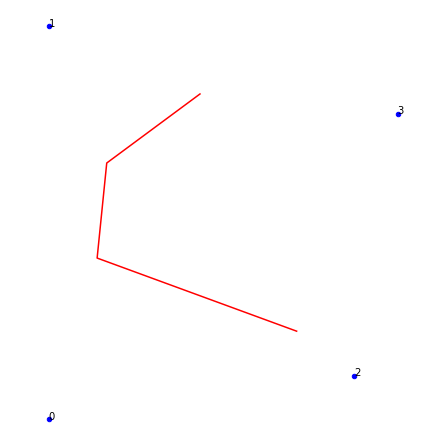

,0,1
0,4.531923,-0.452466
1,-1.331121,3.129933
2,-1.110876,-3.691941
3,1.317242,-1.016389


'-----------Iteration: 1000--------------'

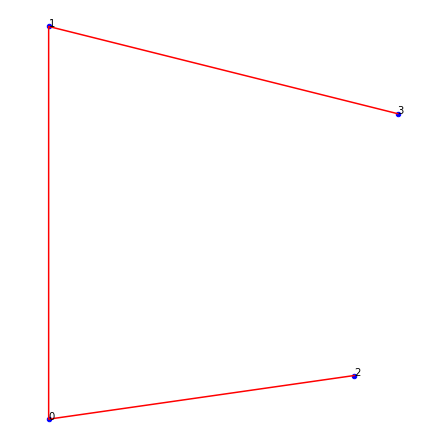

,0,1
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0


alpha:  0.0009954703940636294
time:  0.40754401200001666
Iterations:  1378
Cost:  30.400041593399017


'######### Result #########'

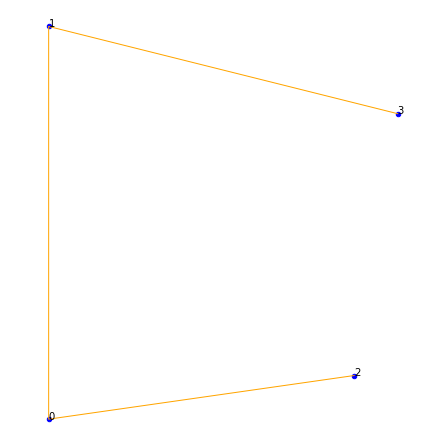

array([3, 1, 0, 2])

In [7]:
np.random.seed(100)
som=SOM(cities=cities,alpha=1,alphaRate=0.995,rRate=0.001)
som.run()

In [8]:
def OpenTest(name):
    with open(name,'r') as f:
        lines=f.readlines()
        cities=np.ones((len(lines),2))
        for i in range(len(lines)):
            cities[i]=float(lines[i].split()[1]),float(lines[i].split()[2])
    return cities
test1=OpenTest('1.tsp')
pd.DataFrame(test1)

,0,1
0,1150.0,1760.0
1,630.0,1660.0
2,40.0,2090.0
3,750.0,1100.0
4,750.0,2030.0
5,1030.0,2070.0
6,1650.0,650.0
7,1490.0,1630.0
8,790.0,2260.0
9,710.0,1310.0


# Test1
we create som from SOM with these parameters. we found out alpha=1 and alphaRate=0.9998 are good .. now we want to find better rRate

Radius:  54.0


'-----------Iteration: 0--------------'

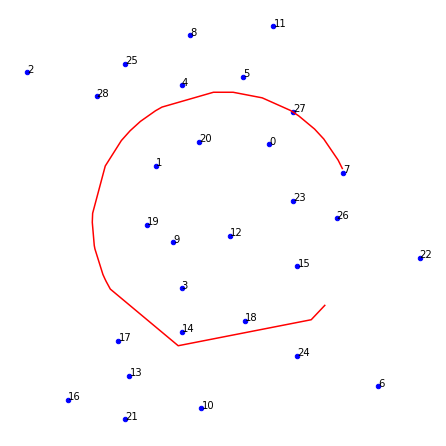

,0,1
0,354.102579,-408.989971
1,373.335995,-447.445692
2,89.143199,-154.201781
3,-98.712389,80.255965
4,-136.176840,-130.062848
5,-109.084223,-148.119335
6,-97.034204,-155.490055
7,51.342697,327.215950
8,44.419598,71.733816
9,-145.276168,31.669173


'-----------Iteration: 1000--------------'

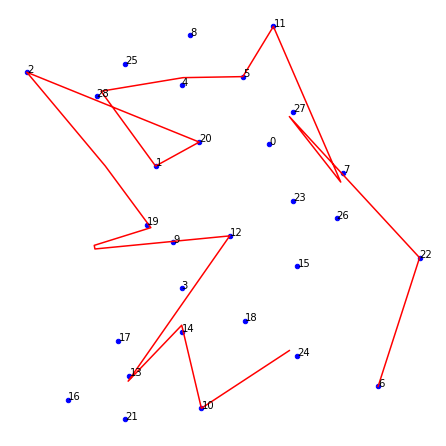

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.012911,-0.017606
4,-0.015083,-0.042319
5,-0.015083,-0.042319
6,-0.015083,-0.042319
7,0.000000,0.000000
8,0.000000,0.000000
9,0.004695,0.026996


'-----------Iteration: 2000--------------'

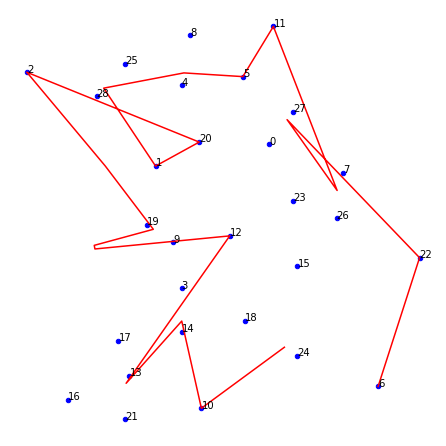

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.008342,-0.011376
4,-0.017126,-0.033968
5,-0.017126,-0.033968
6,-0.017126,-0.033968
7,0.000000,0.000000
8,0.000000,0.000000
9,0.003034,0.017443


'-----------Iteration: 3000--------------'

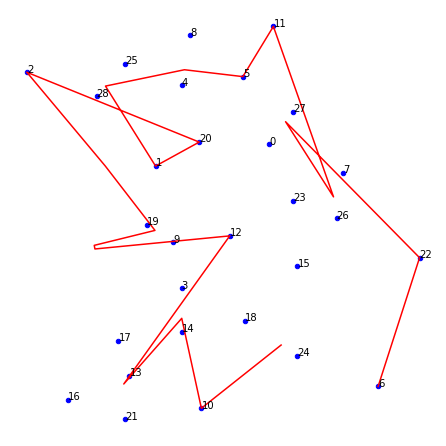

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.005734,-0.007819
4,-0.015623,-0.025012
5,-0.015623,-0.025012
6,-0.015623,-0.025012
7,0.000000,0.000000
8,0.000000,0.000000
9,0.002085,0.011989


'-----------Iteration: 4000--------------'

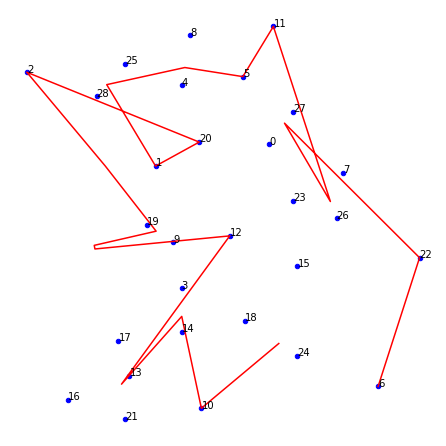

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.004111,-0.005606
4,-0.013066,-0.017919
5,-0.013066,-0.017919
6,-0.013066,-0.017919
7,0.000000,0.000000
8,0.000000,0.000000
9,0.001495,0.008596


'-----------Iteration: 5000--------------'

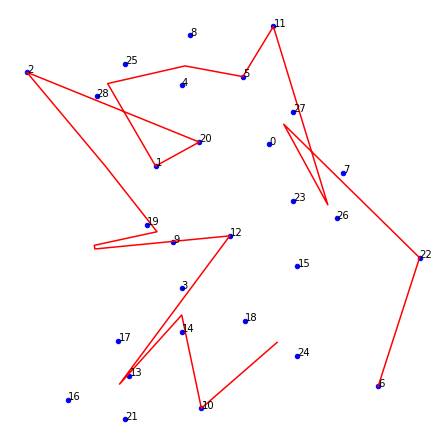

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.003038,-0.004143
4,-0.010538,-0.012819
5,-0.010538,-0.012819
6,-0.010538,-0.012819
7,0.000000,0.000000
8,0.000000,0.000000
9,0.001105,0.006353


'-----------Iteration: 6000--------------'

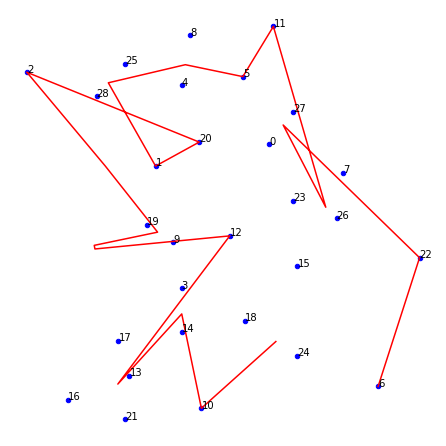

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.002296,-0.003131
4,-0.008383,-0.009260
5,-0.008383,-0.009260
6,-0.008383,-0.009260
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000835,0.004801


'-----------Iteration: 7000--------------'

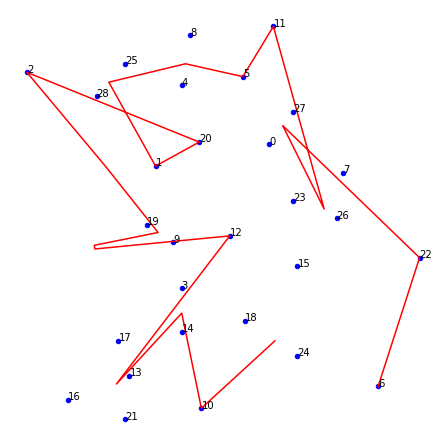

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.001765,-0.002406
4,-0.006644,-0.006783
5,-0.006644,-0.006783
6,-0.006644,-0.006783
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000642,0.003690


'-----------Iteration: 8000--------------'

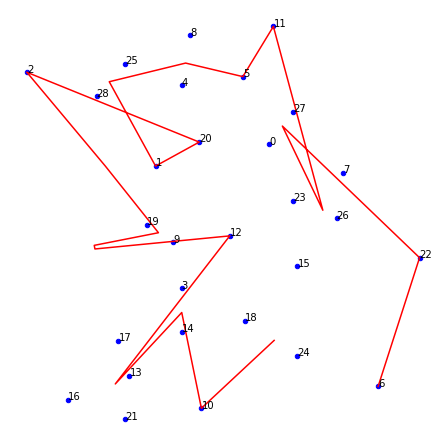

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.001374,-0.001873
4,-0.005270,-0.005042
5,-0.005270,-0.005042
6,-0.005270,-0.005042
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000500,0.002872


'-----------Iteration: 9000--------------'

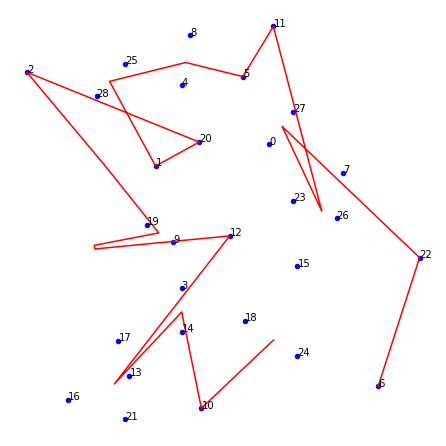

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.001080,-0.001473
4,-0.004193,-0.003801
5,-0.004193,-0.003801
6,-0.004193,-0.003801
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000393,0.002259


'-----------Iteration: 10000--------------'

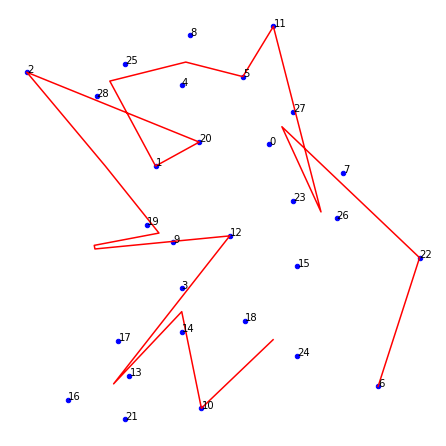

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000856,-0.001168
4,-0.003347,-0.002902
5,-0.003347,-0.002902
6,-0.003347,-0.002902
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000311,0.001790


'-----------Iteration: 11000--------------'

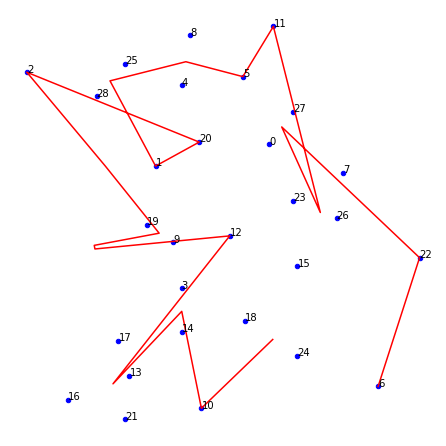

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000683,-0.000931
4,-0.002682,-0.002240
5,-0.002682,-0.002240
6,-0.002682,-0.002240
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000248,0.001428


'-----------Iteration: 12000--------------'

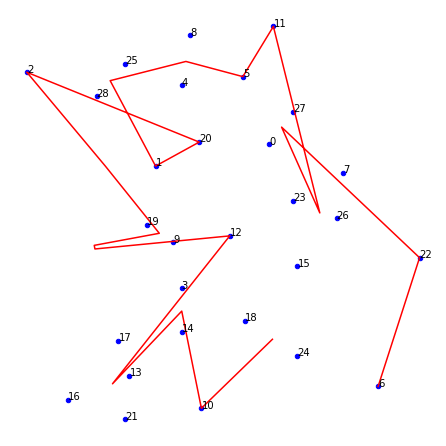

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000547,-0.000746
4,-0.002156,-0.001746
5,-0.002156,-0.001746
6,-0.002156,-0.001746
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000199,0.001145


'-----------Iteration: 13000--------------'

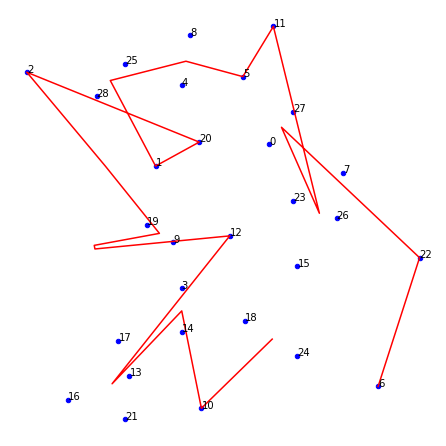

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000441,-0.000601
4,-0.001738,-0.001372
5,-0.001738,-0.001372
6,-0.001738,-0.001372
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000160,0.000921


'-----------Iteration: 14000--------------'

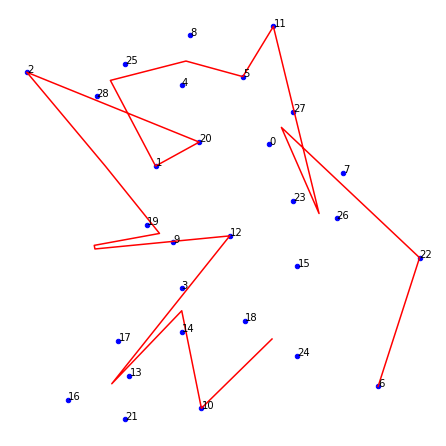

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000356,-0.000485
4,-0.001405,-0.001086
5,-0.001405,-0.001086
6,-0.001405,-0.001086
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000129,0.000744


'-----------Iteration: 15000--------------'

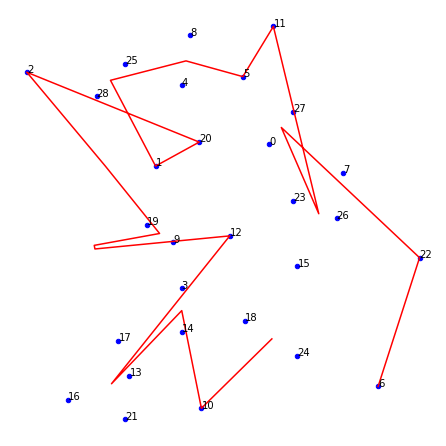

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000288,-0.000393
4,-0.001138,-0.000865
5,-0.001138,-0.000865
6,-0.001138,-0.000865
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000105,0.000602


'-----------Iteration: 16000--------------'

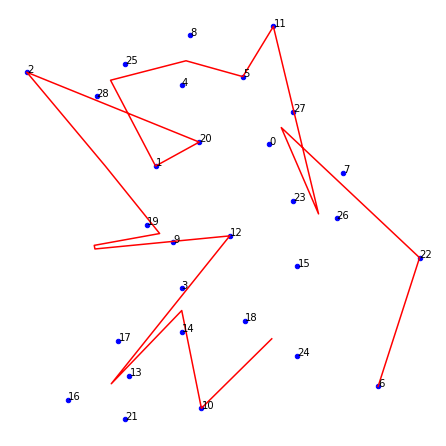

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000234,-0.000319
4,-0.000923,-0.000692
5,-0.000923,-0.000692
6,-0.000923,-0.000692
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000085,0.000488


'-----------Iteration: 17000--------------'

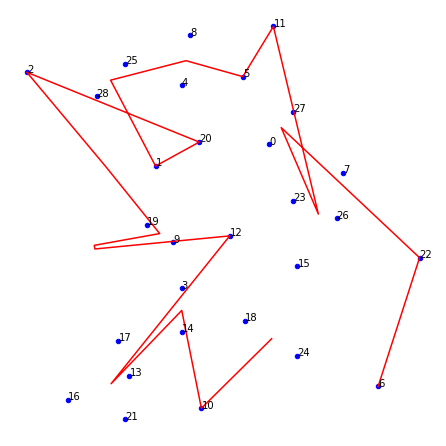

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000190,-0.000259
4,-0.000751,-0.000556
5,-0.000751,-0.000556
6,-0.000751,-0.000556
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000069,0.000397


'-----------Iteration: 18000--------------'

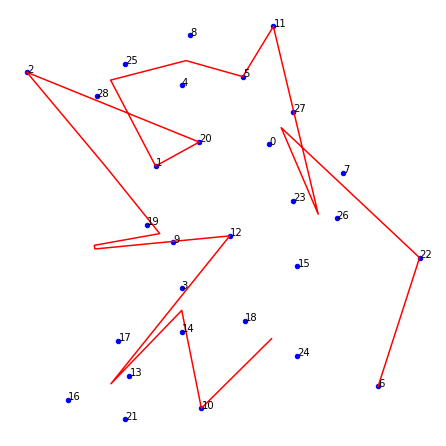

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000154,-0.000211
4,-0.000611,-0.000448
5,-0.000611,-0.000448
6,-0.000611,-0.000448
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000056,0.000323


'-----------Iteration: 19000--------------'

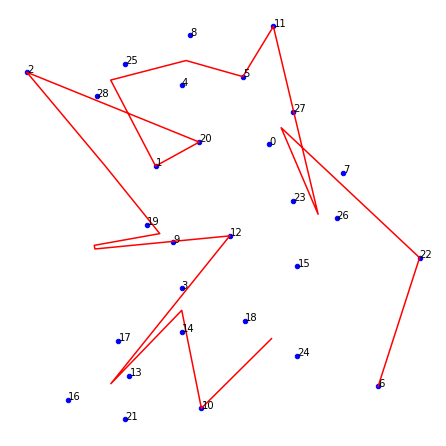

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000126,-0.000172
4,-0.000498,-0.000362
5,-0.000498,-0.000362
6,-0.000498,-0.000362
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000046,0.000263


'-----------Iteration: 20000--------------'

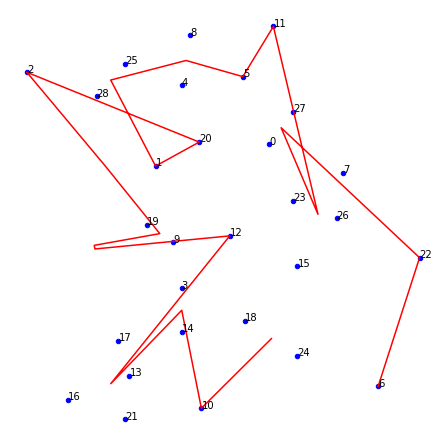

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000103,-0.000140
4,-0.000406,-0.000293
5,-0.000406,-0.000293
6,-0.000406,-0.000293
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000037,0.000214


'-----------Iteration: 21000--------------'

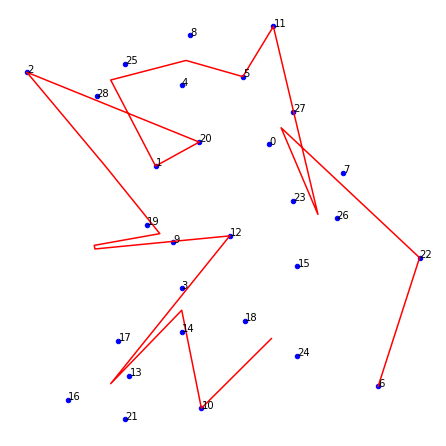

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000084,-0.000114
4,-0.000331,-0.000238
5,-0.000331,-0.000238
6,-0.000331,-0.000238
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000030,0.000175


'-----------Iteration: 22000--------------'

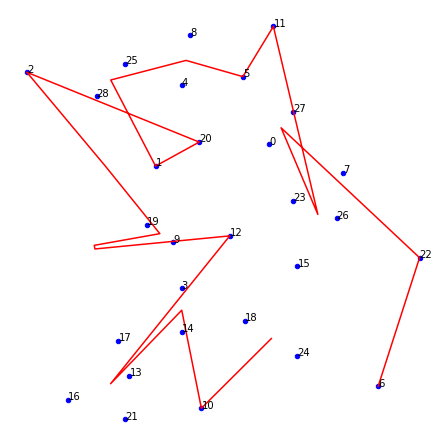

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000068,-0.000093
4,-0.000270,-0.000193
5,-0.000270,-0.000193
6,-0.000270,-0.000193
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000025,0.000143


'-----------Iteration: 23000--------------'

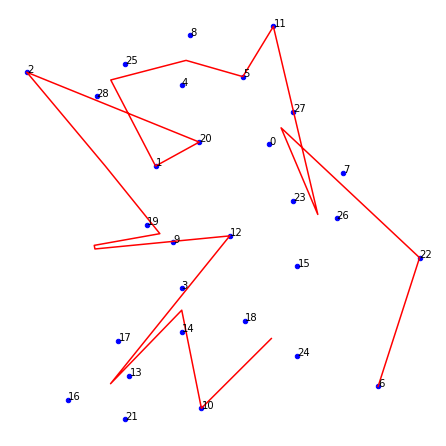

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000056,-0.000076
4,-0.000221,-0.000157
5,-0.000221,-0.000157
6,-0.000221,-0.000157
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000020,0.000117


'-----------Iteration: 24000--------------'

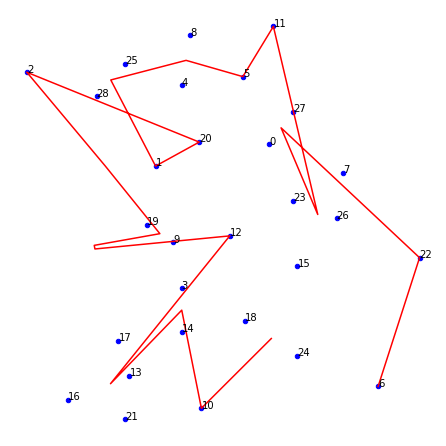

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000046,-0.000062
4,-0.000180,-0.000128
5,-0.000180,-0.000128
6,-0.000180,-0.000128
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000017,0.000095


'-----------Iteration: 25000--------------'

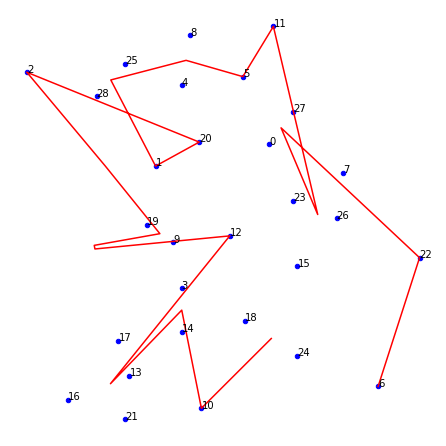

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000037,-0.000051
4,-0.000148,-0.000105
5,-0.000148,-0.000105
6,-0.000148,-0.000105
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000014,0.000078


'-----------Iteration: 26000--------------'

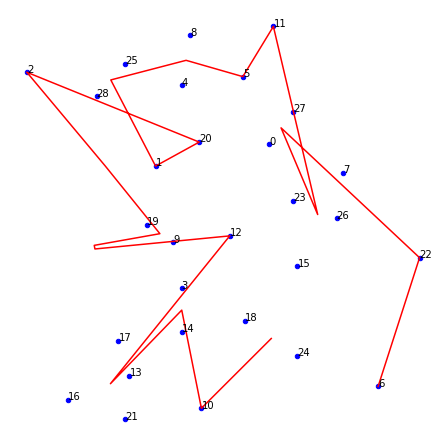

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000030,-0.000042
4,-0.000121,-0.000085
5,-0.000121,-0.000085
6,-0.000121,-0.000085
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000011,0.000064


'-----------Iteration: 27000--------------'

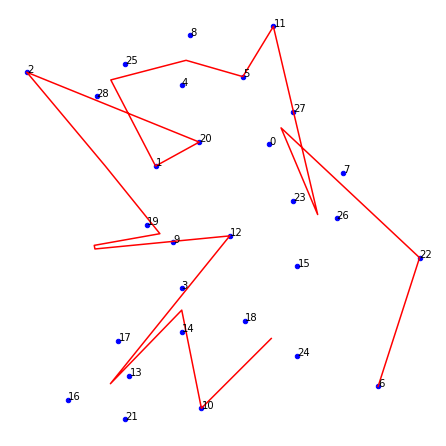

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000025,-0.000034
4,-0.000099,-0.000070
5,-0.000099,-0.000070
6,-0.000099,-0.000070
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000009,0.000052


'-----------Iteration: 28000--------------'

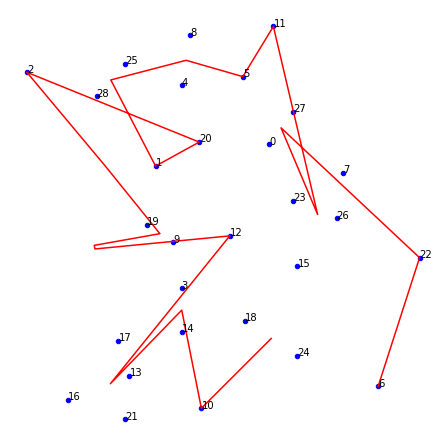

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000020,-0.000028
4,-0.000081,-0.000057
5,-0.000081,-0.000057
6,-0.000081,-0.000057
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000007,0.000043


'-----------Iteration: 29000--------------'

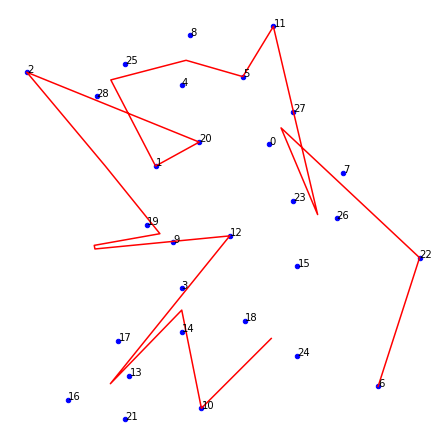

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000017,-0.000023
4,-0.000066,-0.000047
5,-0.000066,-0.000047
6,-0.000066,-0.000047
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000006,0.000035


'-----------Iteration: 30000--------------'

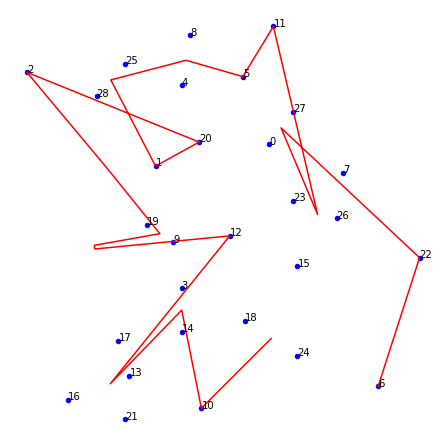

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000014,-0.000019
4,-0.000054,-0.000038
5,-0.000054,-0.000038
6,-0.000054,-0.000038
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000005,0.000029


'-----------Iteration: 31000--------------'

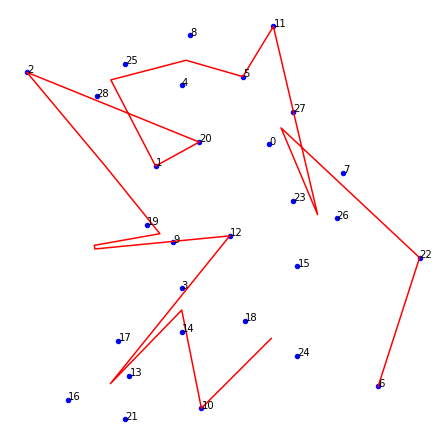

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000011,-0.000015
4,-0.000044,-0.000031
5,-0.000044,-0.000031
6,-0.000044,-0.000031
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000004,0.000023


'-----------Iteration: 32000--------------'

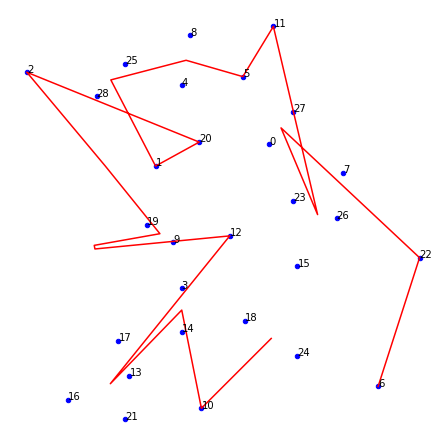

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000009,-0.000012
4,-0.000036,-0.000025
5,-0.000036,-0.000025
6,-0.000036,-0.000025
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000003,0.000019


'-----------Iteration: 33000--------------'

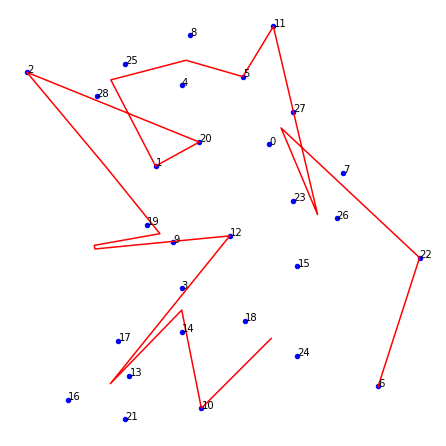

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000007,-0.000010
4,-0.000030,-0.000021
5,-0.000030,-0.000021
6,-0.000030,-0.000021
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000003,0.000016


'-----------Iteration: 34000--------------'

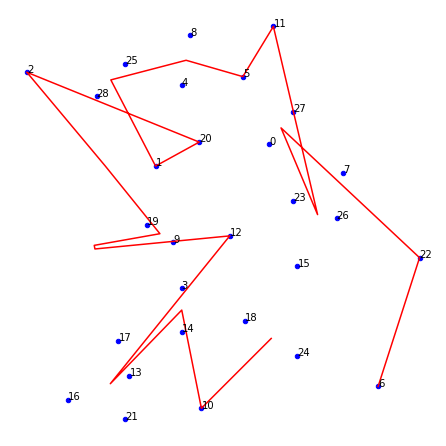

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000000,0.000000e+00
3,-0.000006,-8.358188e-06
4,-0.000024,-1.702761e-05
5,-0.000024,-1.702761e-05
6,-0.000024,-1.702761e-05
7,0.000000,0.000000e+00
8,0.000000,0.000000e+00
9,0.000002,1.281589e-05


alpha:  0.000999864476057279
time:  21.511639817000002
Iterations:  34535
Cost:  27322.416508241196


'######### Result #########'

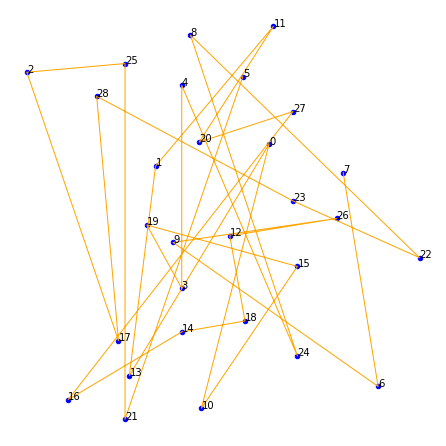

array([ 5, 21, 25,  2, 17, 28, 23, 22,  8, 24,  4,  3, 19, 15, 10,  0, 13,
        1, 11, 20, 27, 16, 14, 18, 12, 26,  9,  6,  7])

In [12]:
np.random.seed(2000)
som=SOM(cities=test1,alpha=1,alphaRate=0.9998,rRate=0.03)
som.run()


Radius:  144.0


'-----------Iteration: 0--------------'

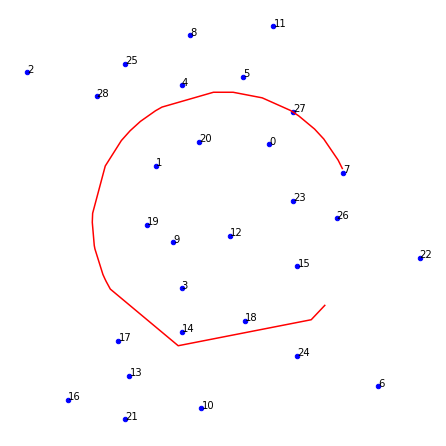

,0,1
0,-205.897421,-858.989971
1,-186.664005,-897.445692
2,439.143199,-544.201781
3,-98.712389,80.255965
4,-26.176840,19.937152
5,0.915777,1.880665
6,12.965796,-5.490055
7,141.342697,-62.784050
8,44.419598,71.733816
9,134.723832,71.669173


'-----------Iteration: 1000--------------'

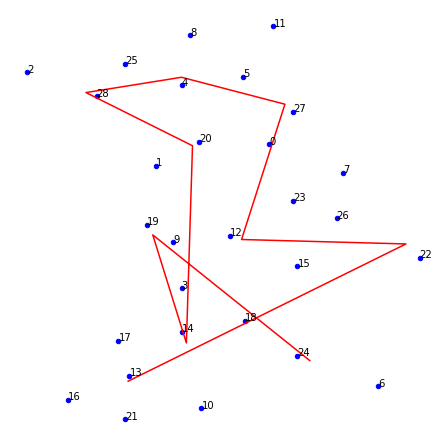

,0,1
0,-0.007706,-0.015433
1,-0.007706,-0.015433
2,-0.054303,0.049818
3,0.046051,-0.008019
4,0.046051,-0.008019
5,0.046051,-0.008019
6,0.046051,-0.008019
7,0.046051,-0.008019
8,-0.029429,0.031893
9,-0.029429,0.031893


'-----------Iteration: 2000--------------'

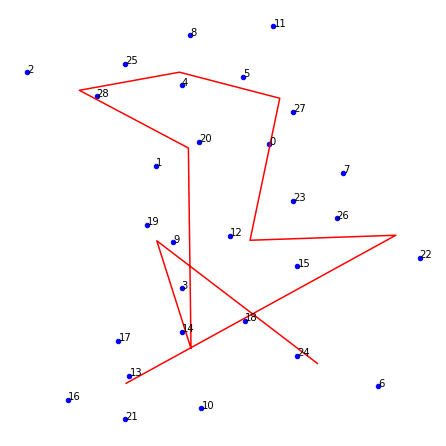

,0,1
0,-0.010418,-0.005430
1,-0.010418,-0.005430
2,-0.039134,0.031490
3,0.032343,-0.000124
4,0.032343,-0.000124
5,0.032343,-0.000124
6,0.032343,-0.000124
7,0.032343,-0.000124
8,-0.018611,0.022499
9,-0.018611,0.022499


'-----------Iteration: 3000--------------'

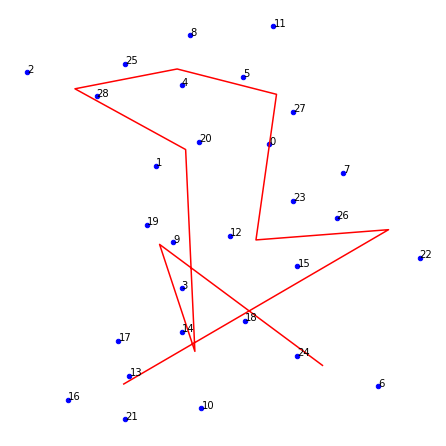

,0,1
0,-0.010777,-0.001590
1,-0.010777,-0.001590
2,-0.028023,0.020433
3,0.022756,0.002623
4,0.022756,0.002623
5,0.022756,0.002623
6,0.022756,0.002623
7,0.022756,0.002623
8,-0.011828,0.013956
9,-0.011828,0.013956


'-----------Iteration: 4000--------------'

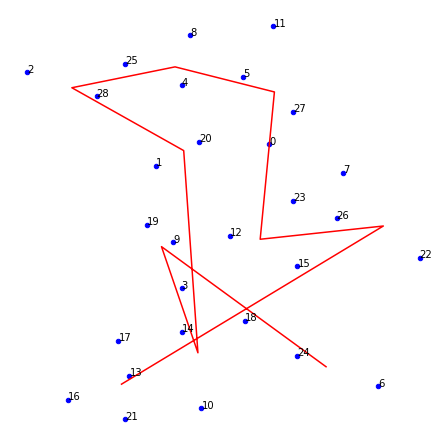

,0,1
0,-0.009833,-0.000208
1,-0.009833,-0.000208
2,-0.020333,0.013717
3,0.016299,0.003325
4,0.016299,0.003325
5,0.016299,0.003325
6,0.016299,0.003325
7,0.016299,0.003325
8,-0.007669,0.008134
9,-0.007669,0.008134


'-----------Iteration: 5000--------------'

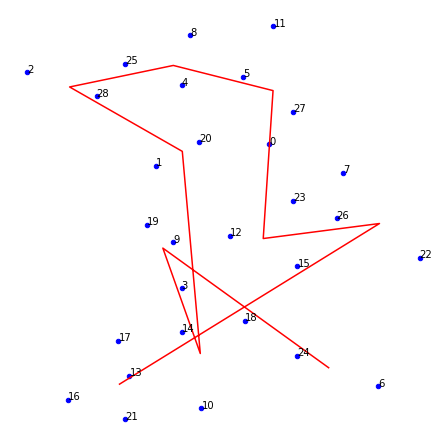

,0,1
0,-0.008445,0.000234
1,-0.008445,0.000234
2,-0.015016,0.009513
3,0.011919,0.003247
4,0.011919,0.003247
5,0.011919,0.003247
6,0.011919,0.003247
7,0.011919,0.003247
8,-0.005109,0.004546
9,-0.005109,0.004546


'-----------Iteration: 6000--------------'

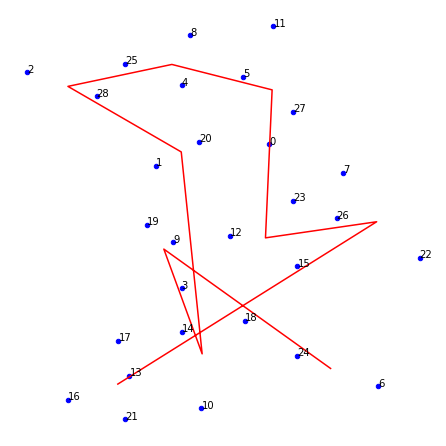

,0,1
0,-0.007039,0.000333
1,-0.007039,0.000333
2,-0.011280,0.006788
3,0.008885,0.002898
4,0.008885,0.002898
5,0.008885,0.002898
6,0.008885,0.002898
7,0.008885,0.002898
8,-0.003500,0.002425
9,-0.003500,0.002425


'-----------Iteration: 7000--------------'

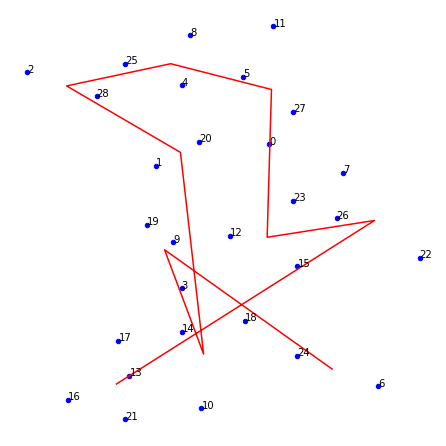

,0,1
0,-0.005781,0.000314
1,-0.005781,0.000314
2,-0.008602,0.004962
3,0.006735,0.002484
4,0.006735,0.002484
5,0.006735,0.002484
6,0.006735,0.002484
7,0.006735,0.002484
8,-0.002463,0.001199
9,-0.002463,0.001199


'-----------Iteration: 8000--------------'

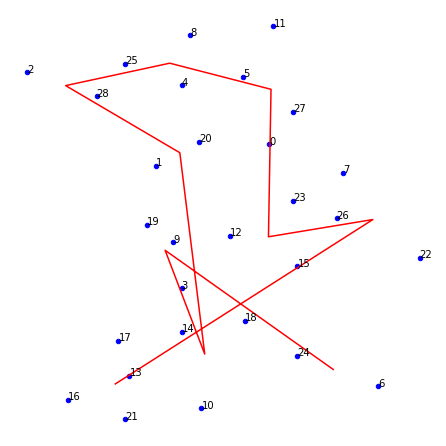

,0,1
0,-0.004715,0.000263
1,-0.004715,0.000263
2,-0.006644,0.003701
3,0.005176,0.002087
4,0.005176,0.002087
5,0.005176,0.002087
6,0.005176,0.002087
7,0.005176,0.002087
8,-0.001775,0.000504
9,-0.001775,0.000504


'-----------Iteration: 9000--------------'

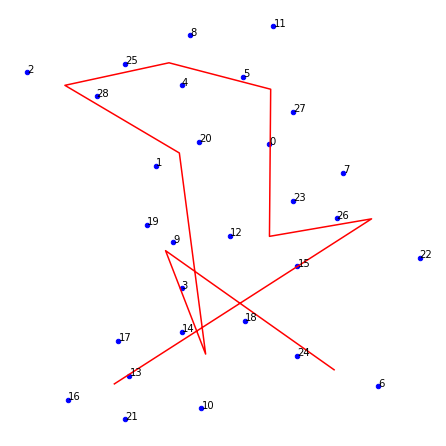

,0,1
0,-0.003833,0.000210
1,-0.003833,0.000210
2,-0.005186,0.002807
3,0.004025,0.001734
4,0.004025,0.001734
5,0.004025,0.001734
6,0.004025,0.001734
7,0.004025,0.001734
8,-0.001306,0.000120
9,-0.001306,0.000120


'-----------Iteration: 10000--------------'

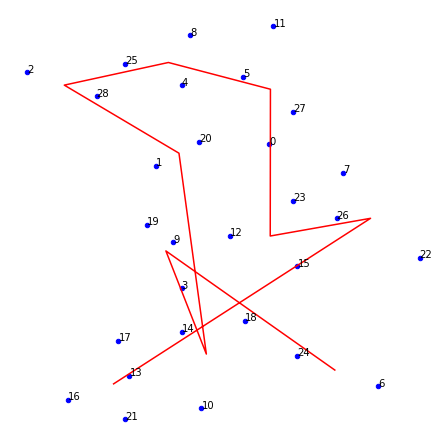

,0,1
0,-0.003113,0.000165
1,-0.003113,0.000165
2,-0.004083,0.002159
3,0.003159,0.001432
4,0.003159,0.001432
5,0.003159,0.001432
6,0.003159,0.001432
7,0.003159,0.001432
8,-0.000978,-0.000083
9,-0.000978,-0.000083


'-----------Iteration: 11000--------------'

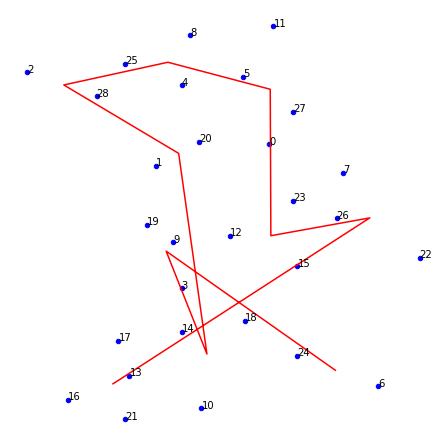

,0,1
0,-0.002529,0.000128
1,-0.002529,0.000128
2,-0.003238,0.001679
3,0.002499,0.001178
4,0.002499,0.001178
5,0.002499,0.001178
6,0.002499,0.001178
7,0.002499,0.001178
8,-0.000744,-0.000182
9,-0.000744,-0.000182


'-----------Iteration: 12000--------------'

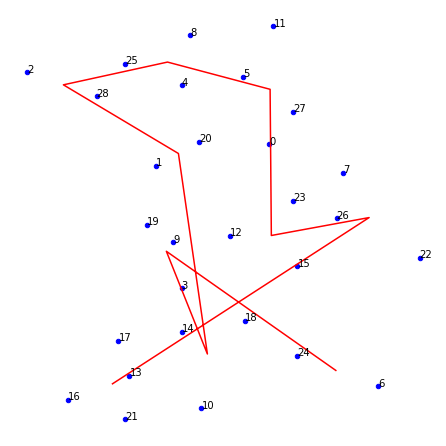

,0,1
0,-0.002055,0.000099
1,-0.002055,0.000099
2,-0.002583,0.001318
3,0.001989,0.000967
4,0.001989,0.000967
5,0.001989,0.000967
6,0.001989,0.000967
7,0.001989,0.000967
8,-0.000573,-0.000220
9,-0.000573,-0.000220


'-----------Iteration: 13000--------------'

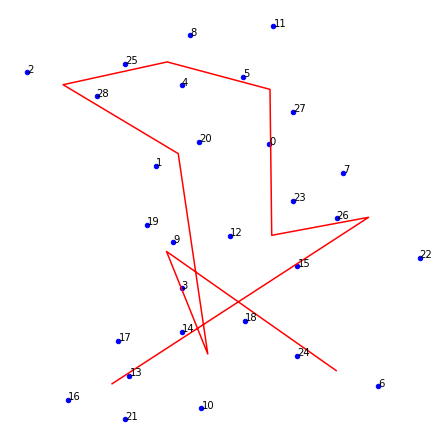

,0,1
0,-0.001672,0.000077
1,-0.001672,0.000077
2,-0.002070,0.001042
3,0.001592,0.000793
4,0.001592,0.000793
5,0.001592,0.000793
6,0.001592,0.000793
7,0.001592,0.000793
8,-0.000446,-0.000226
9,-0.000446,-0.000226


'-----------Iteration: 14000--------------'

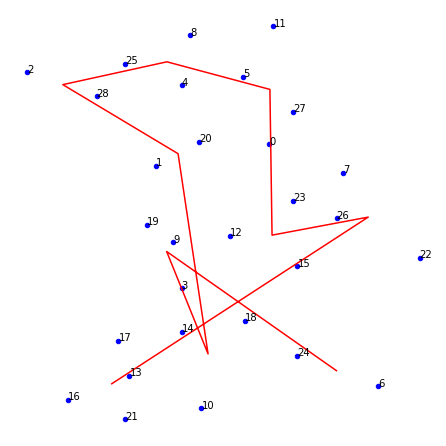

,0,1
0,-0.001361,0.000060
1,-0.001361,0.000060
2,-0.001666,0.000829
3,0.001279,0.000650
4,0.001279,0.000650
5,0.001279,0.000650
6,0.001279,0.000650
7,0.001279,0.000650
8,-0.000350,-0.000215
9,-0.000350,-0.000215


'-----------Iteration: 15000--------------'

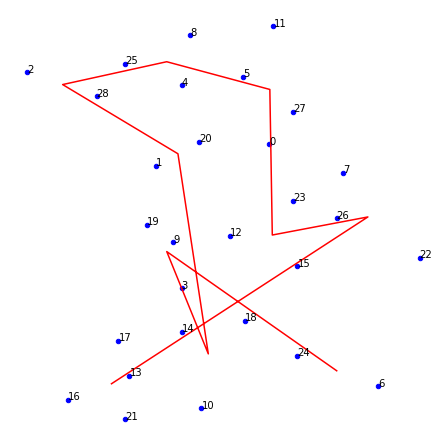

,0,1
0,-0.001109,0.000047
1,-0.001109,0.000047
2,-0.001344,0.000663
3,0.001031,0.000532
4,0.001031,0.000532
5,0.001031,0.000532
6,0.001031,0.000532
7,0.001031,0.000532
8,-0.000277,-0.000195
9,-0.000277,-0.000195


'-----------Iteration: 16000--------------'

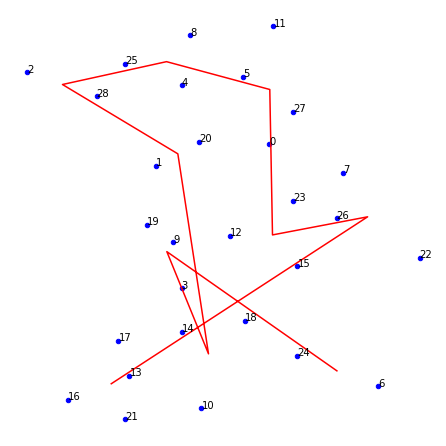

,0,1
0,-0.000904,0.000037
1,-0.000904,0.000037
2,-0.001088,0.000533
3,0.000834,0.000435
4,0.000834,0.000435
5,0.000834,0.000435
6,0.000834,0.000435
7,0.000834,0.000435
8,-0.000220,-0.000172
9,-0.000220,-0.000172


'-----------Iteration: 17000--------------'

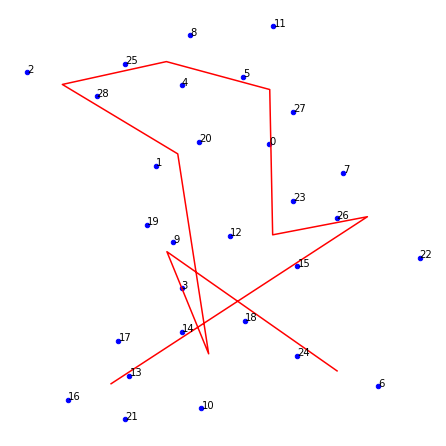

,0,1
0,-0.000738,0.000030
1,-0.000738,0.000030
2,-0.000882,0.000430
3,0.000676,0.000357
4,0.000676,0.000357
5,0.000676,0.000357
6,0.000676,0.000357
7,0.000676,0.000357
8,-0.000176,-0.000149
9,-0.000176,-0.000149


'-----------Iteration: 18000--------------'

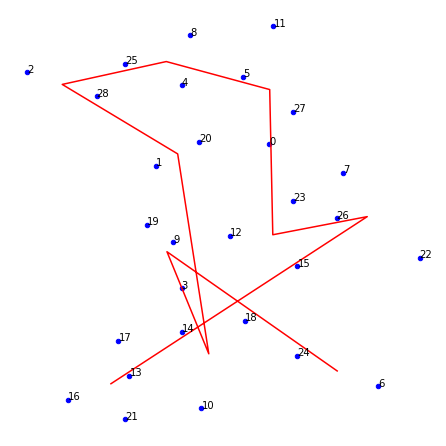

,0,1
0,-0.000602,0.000024
1,-0.000602,0.000024
2,-0.000717,0.000347
3,0.000548,0.000292
4,0.000548,0.000292
5,0.000548,0.000292
6,0.000548,0.000292
7,0.000548,0.000292
8,-0.000142,-0.000127
9,-0.000142,-0.000127


'-----------Iteration: 19000--------------'

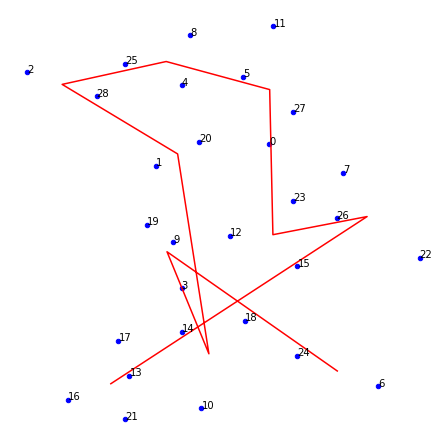

,0,1
0,-0.000492,0.000019
1,-0.000492,0.000019
2,-0.000583,0.000281
3,0.000446,0.000239
4,0.000446,0.000239
5,0.000446,0.000239
6,0.000446,0.000239
7,0.000446,0.000239
8,-0.000114,-0.000108
9,-0.000114,-0.000108


'-----------Iteration: 20000--------------'

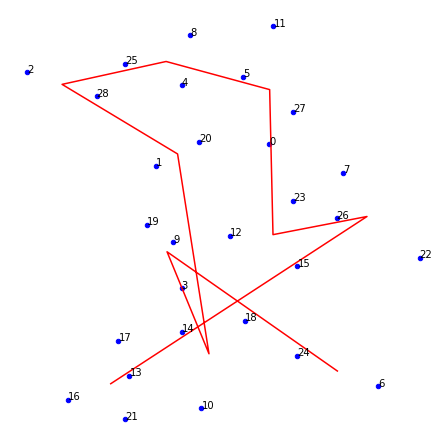

,0,1
0,-0.000402,0.000015
1,-0.000402,0.000015
2,-0.000475,0.000228
3,0.000363,0.000196
4,0.000363,0.000196
5,0.000363,0.000196
6,0.000363,0.000196
7,0.000363,0.000196
8,-0.000092,-0.000091
9,-0.000092,-0.000091


'-----------Iteration: 21000--------------'

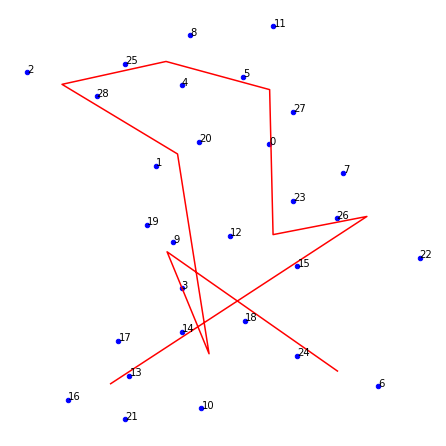

,0,1
0,-0.000329,0.000012
1,-0.000329,0.000012
2,-0.000387,0.000186
3,0.000296,0.000160
4,0.000296,0.000160
5,0.000296,0.000160
6,0.000296,0.000160
7,0.000296,0.000160
8,-0.000075,-0.000076
9,-0.000075,-0.000076


'-----------Iteration: 22000--------------'

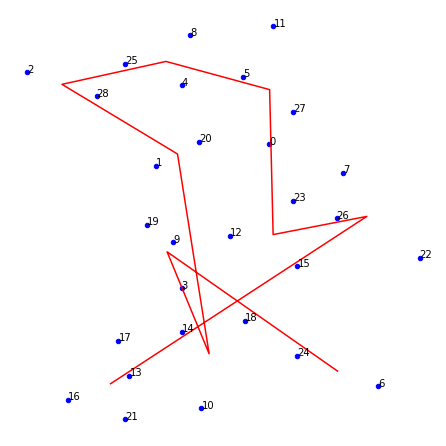

,0,1
0,-0.000269,0.000010
1,-0.000269,0.000010
2,-0.000316,0.000151
3,0.000241,0.000131
4,0.000241,0.000131
5,0.000241,0.000131
6,0.000241,0.000131
7,0.000241,0.000131
8,-0.000061,-0.000063
9,-0.000061,-0.000063


'-----------Iteration: 23000--------------'

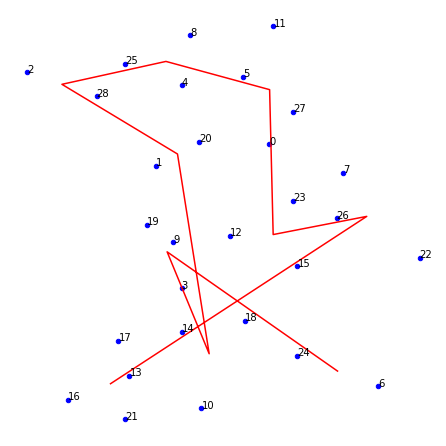

,0,1
0,-0.000220,0.000008
1,-0.000220,0.000008
2,-0.000258,0.000123
3,0.000197,0.000107
4,0.000197,0.000107
5,0.000197,0.000107
6,0.000197,0.000107
7,0.000197,0.000107
8,-0.000049,-0.000052
9,-0.000049,-0.000052


'-----------Iteration: 24000--------------'

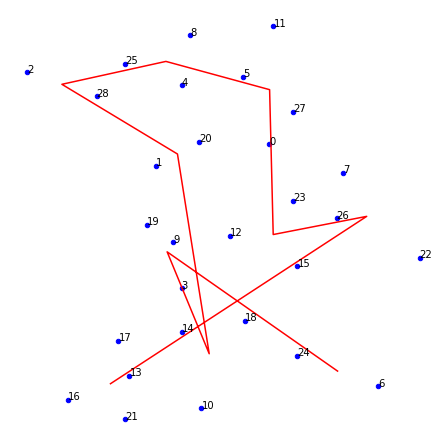

,0,1
0,-0.000180,0.000006
1,-0.000180,0.000006
2,-0.000211,0.000100
3,0.000161,0.000088
4,0.000161,0.000088
5,0.000161,0.000088
6,0.000161,0.000088
7,0.000161,0.000088
8,-0.000040,-0.000043
9,-0.000040,-0.000043


'-----------Iteration: 25000--------------'

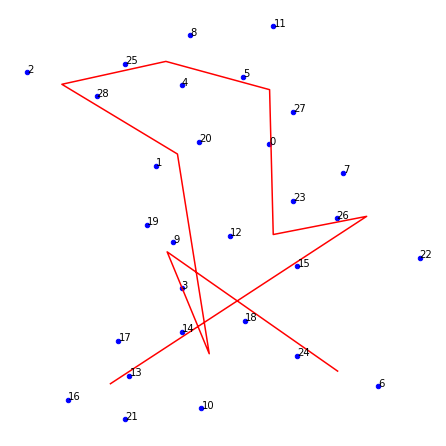

,0,1
0,-0.000147,0.000005
1,-0.000147,0.000005
2,-0.000172,0.000082
3,0.000131,0.000072
4,0.000131,0.000072
5,0.000131,0.000072
6,0.000131,0.000072
7,0.000131,0.000072
8,-0.000033,-0.000036
9,-0.000033,-0.000036


'-----------Iteration: 26000--------------'

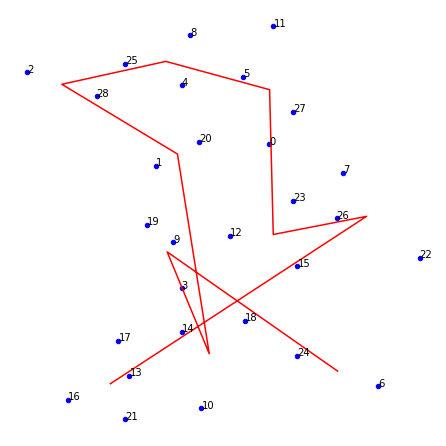

,0,1
0,-0.000120,0.000004
1,-0.000120,0.000004
2,-0.000141,0.000067
3,0.000107,0.000059
4,0.000107,0.000059
5,0.000107,0.000059
6,0.000107,0.000059
7,0.000107,0.000059
8,-0.000027,-0.000029
9,-0.000027,-0.000029


'-----------Iteration: 27000--------------'

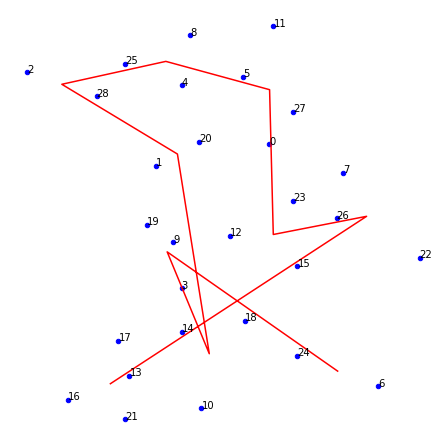

,0,1
0,-0.000098,0.000003
1,-0.000098,0.000003
2,-0.000115,0.000055
3,0.000088,0.000048
4,0.000088,0.000048
5,0.000088,0.000048
6,0.000088,0.000048
7,0.000088,0.000048
8,-0.000022,-0.000024
9,-0.000022,-0.000024


'-----------Iteration: 28000--------------'

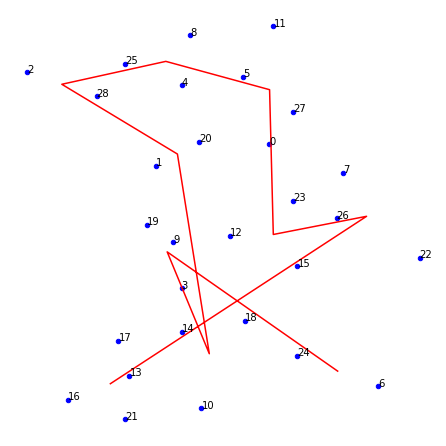

,0,1
0,-0.000081,0.000003
1,-0.000081,0.000003
2,-0.000094,0.000045
3,0.000072,0.000039
4,0.000072,0.000039
5,0.000072,0.000039
6,0.000072,0.000039
7,0.000072,0.000039
8,-0.000018,-0.000020
9,-0.000018,-0.000020


'-----------Iteration: 29000--------------'

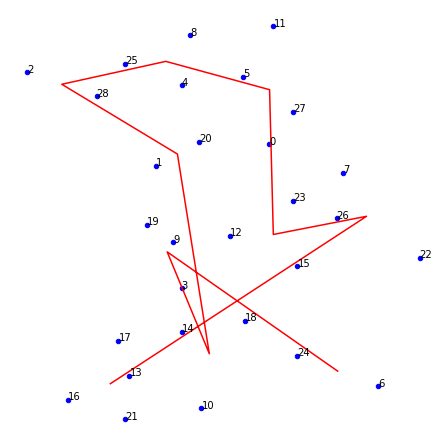

,0,1
0,-0.000066,0.000002
1,-0.000066,0.000002
2,-0.000077,0.000037
3,0.000059,0.000032
4,0.000059,0.000032
5,0.000059,0.000032
6,0.000059,0.000032
7,0.000059,0.000032
8,-0.000015,-0.000016
9,-0.000015,-0.000016


'-----------Iteration: 30000--------------'

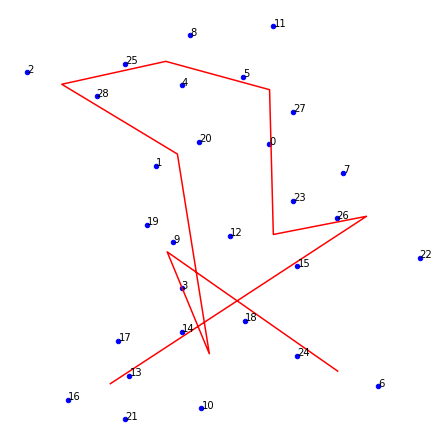

,0,1
0,-0.000054,0.000002
1,-0.000054,0.000002
2,-0.000063,0.000030
3,0.000048,0.000026
4,0.000048,0.000026
5,0.000048,0.000026
6,0.000048,0.000026
7,0.000048,0.000026
8,-0.000012,-0.000013
9,-0.000012,-0.000013


'-----------Iteration: 31000--------------'

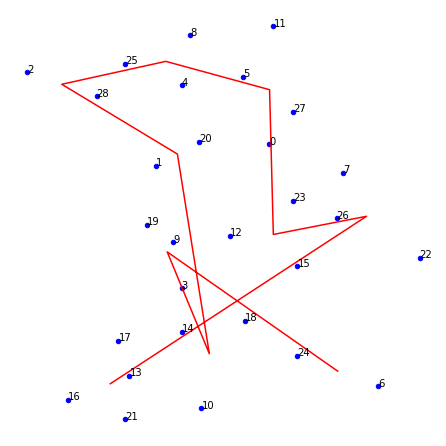

,0,1
0,-0.000044,0.000002
1,-0.000044,0.000002
2,-0.000052,0.000024
3,0.000039,0.000022
4,0.000039,0.000022
5,0.000039,0.000022
6,0.000039,0.000022
7,0.000039,0.000022
8,-0.000010,-0.000011
9,-0.000010,-0.000011


'-----------Iteration: 32000--------------'

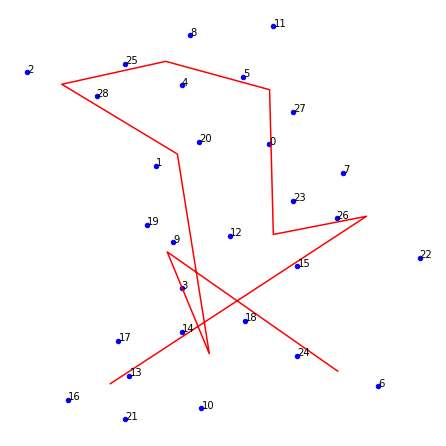

,0,1
0,-0.000036,0.000001
1,-0.000036,0.000001
2,-0.000042,0.000020
3,0.000032,0.000018
4,0.000032,0.000018
5,0.000032,0.000018
6,0.000032,0.000018
7,0.000032,0.000018
8,-0.000008,-0.000009
9,-0.000008,-0.000009


'-----------Iteration: 33000--------------'

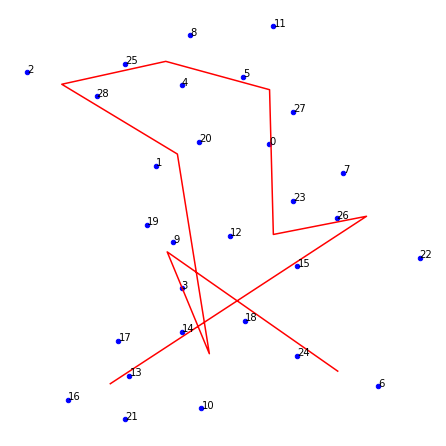

,0,1
0,-0.000030,0.000001
1,-0.000030,0.000001
2,-0.000035,0.000016
3,0.000026,0.000015
4,0.000026,0.000015
5,0.000026,0.000015
6,0.000026,0.000015
7,0.000026,0.000015
8,-0.000006,-0.000007
9,-0.000006,-0.000007


'-----------Iteration: 34000--------------'

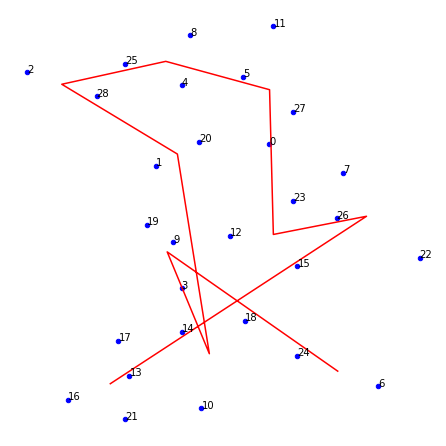

,0,1
0,-0.000024,8.403225e-07
1,-0.000024,8.403225e-07
2,-0.000028,1.339041e-05
3,0.000022,1.187414e-05
4,0.000022,1.187414e-05
5,0.000022,1.187414e-05
6,0.000022,1.187414e-05
7,0.000022,1.187414e-05
8,-0.000005,-6.083802e-06
9,-0.000005,-6.083802e-06


alpha:  0.000999864476057279
time:  21.43374996099999
Iterations:  34535
Cost:  26162.118747577428


'######### Result #########'

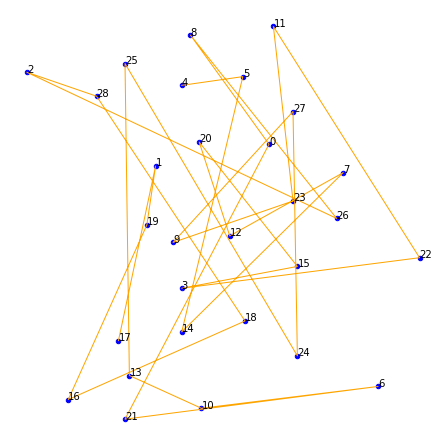

array([17,  1, 19, 16, 18, 28,  2, 26,  8,  0, 21,  6, 10, 13, 25, 24, 27,
        9, 23, 11, 22,  3, 15, 20, 12,  7, 14,  5,  4])

In [13]:
np.random.seed(2000)
som=SOM(cities=test1,alpha=1,alphaRate=0.9998,rRate=0.08)
som.run()

after tests we find rRate=0.001 is better than others we test

Radius:  1.8


'-----------Iteration: 0--------------'

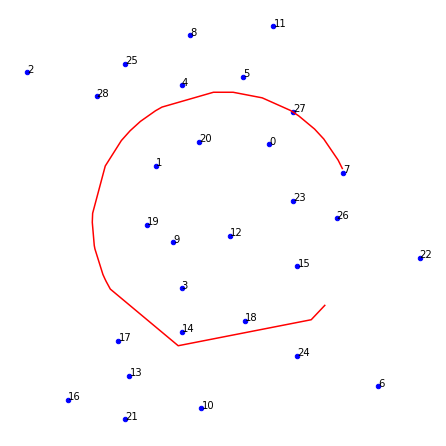

,0,1
0,354.102579,-408.989971
1,23.335995,-57.445692
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
5,0.915777,1.880665
6,-97.034204,-155.490055
7,51.342697,327.215950
8,44.419598,71.733816
9,-105.276168,261.669173


'-----------Iteration: 1000--------------'

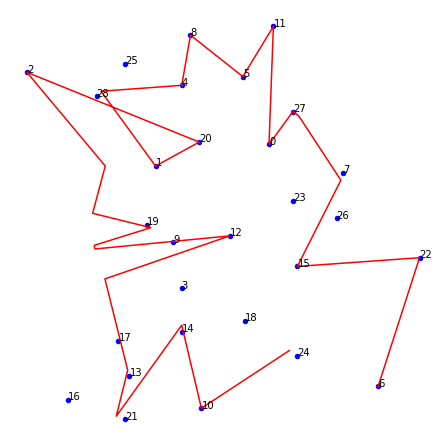

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.013325,-0.028278
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 2000--------------'

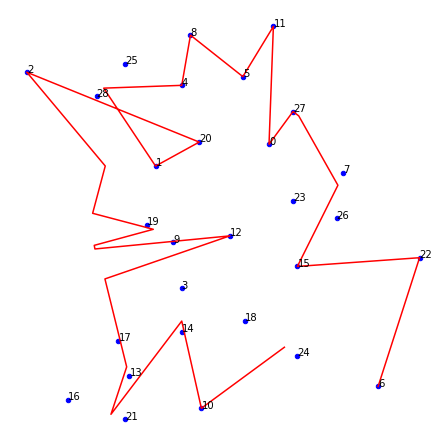

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.013181,-0.018602
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 3000--------------'

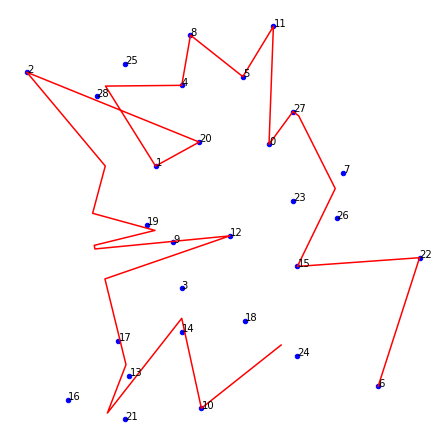

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.011155,-0.012469
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 4000--------------'

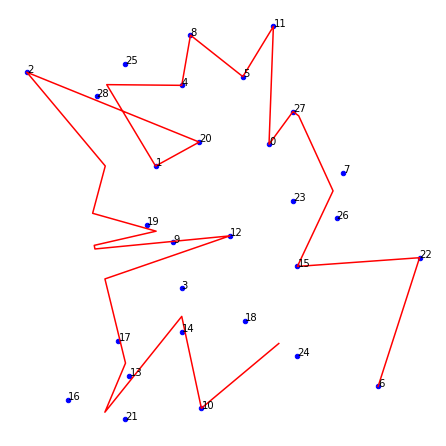

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.008994,-0.008601
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 5000--------------'

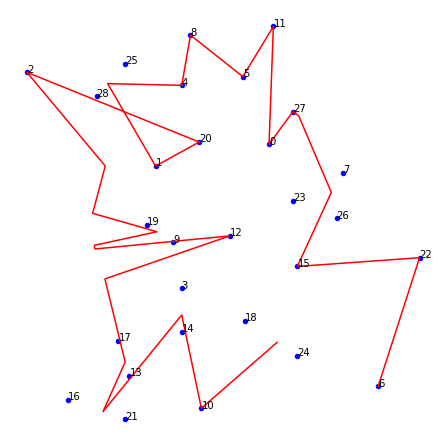

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.007142,-0.006103
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 6000--------------'

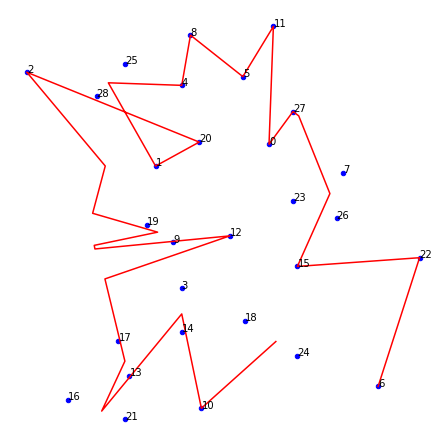

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.005656,-0.004441
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 7000--------------'

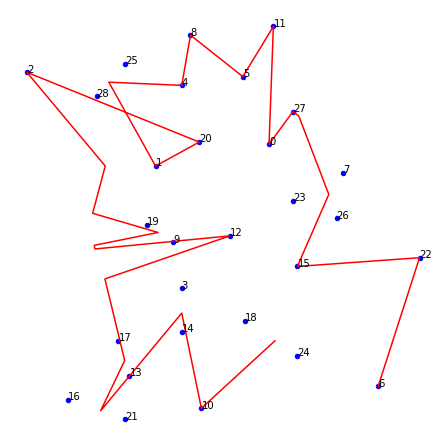

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.004487,-0.003300
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 8000--------------'

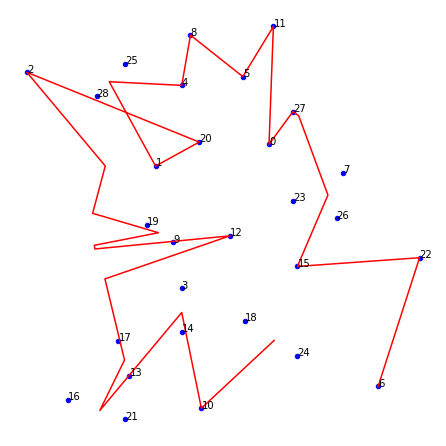

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.003572,-0.002496
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 9000--------------'

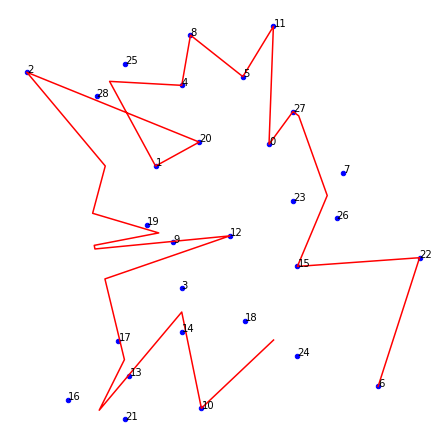

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.002854,-0.001915
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 10000--------------'

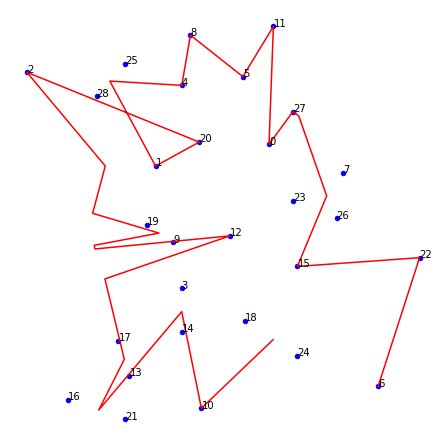

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.002289,-0.001487
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 11000--------------'

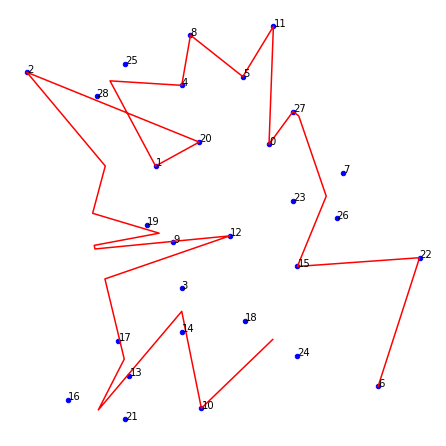

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.001842,-0.001166
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 12000--------------'

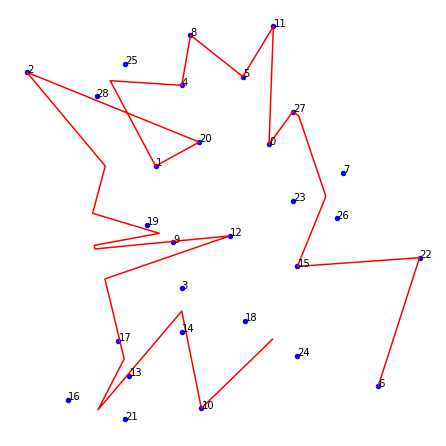

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.001487,-0.000922
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 13000--------------'

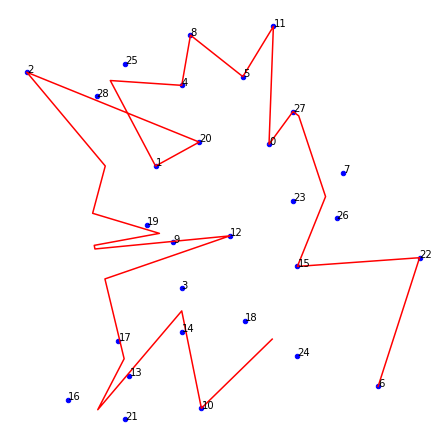

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.001203,-0.000733
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 14000--------------'

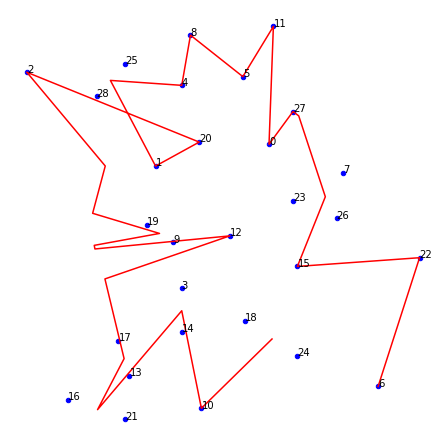

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000975,-0.000586
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 15000--------------'

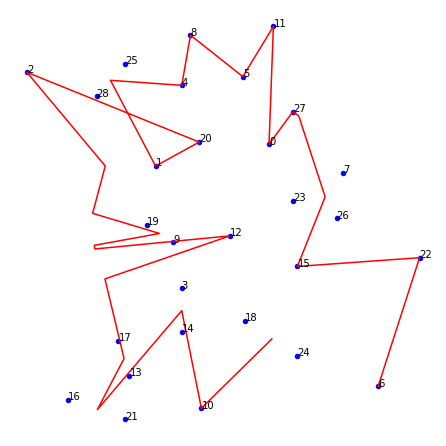

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000792,-0.000471
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 16000--------------'

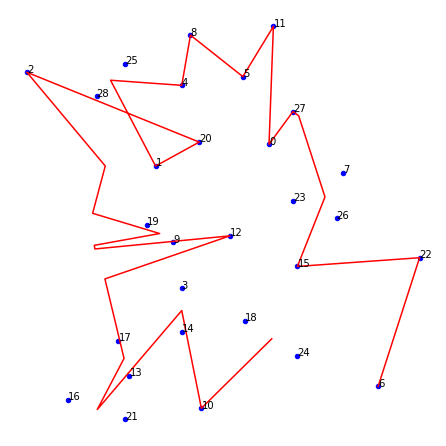

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000644,-0.000379
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 17000--------------'

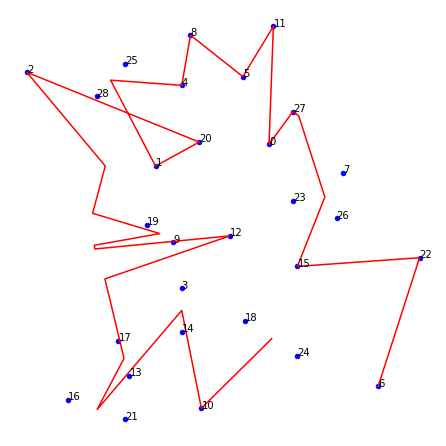

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000525,-0.000307
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 18000--------------'

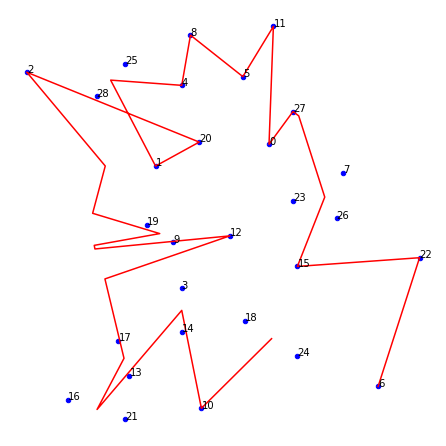

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000428,-0.000248
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 19000--------------'

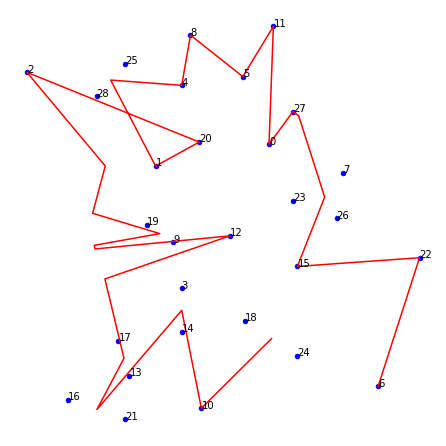

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000349,-0.000202
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 20000--------------'

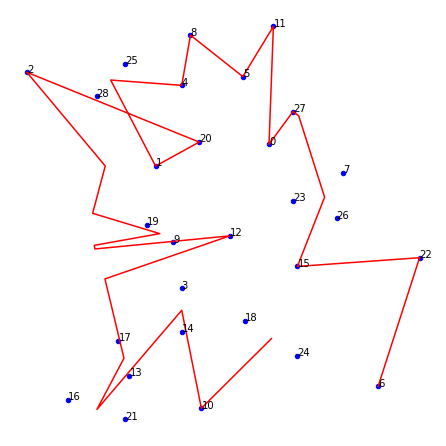

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000285,-0.000164
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 21000--------------'

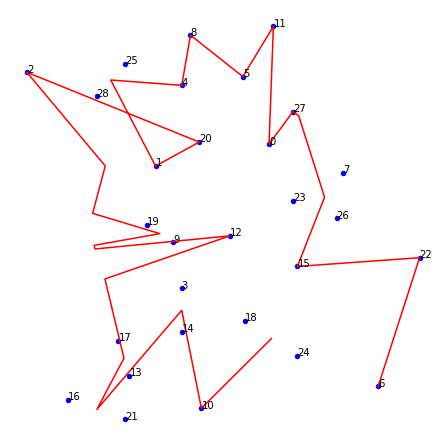

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000232,-0.000133
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 22000--------------'

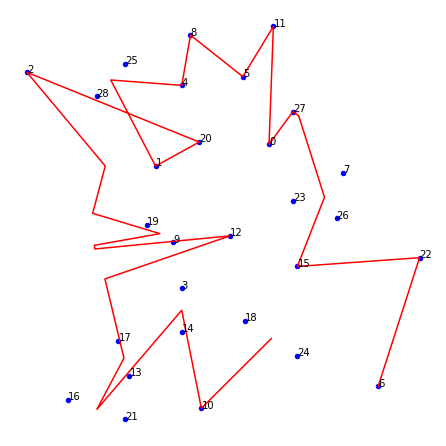

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000190,-0.000109
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 23000--------------'

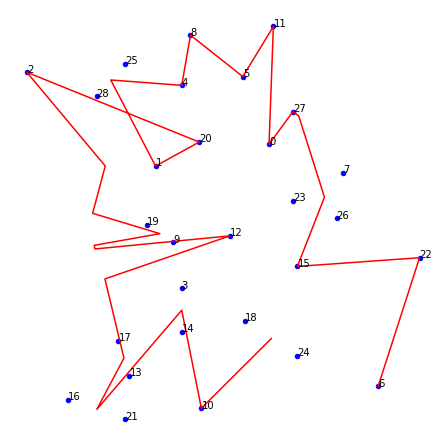

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000155,-0.000089
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 24000--------------'

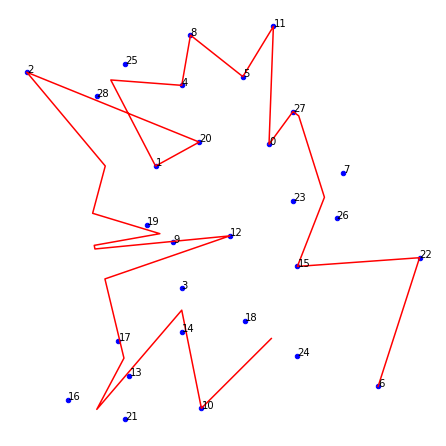

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000127,-0.000072
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 25000--------------'

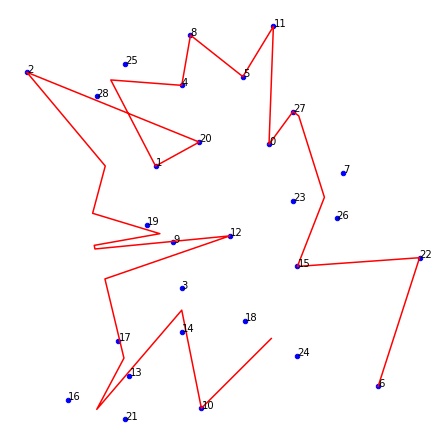

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000104,-0.000059
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 26000--------------'

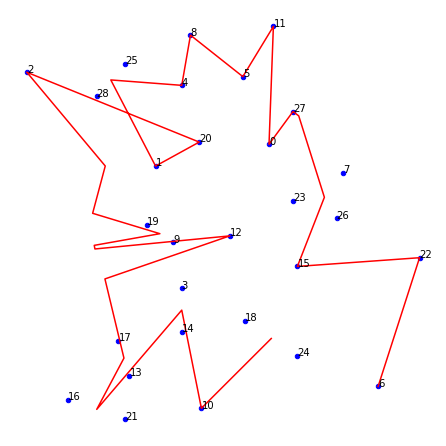

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000085,-0.000048
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 27000--------------'

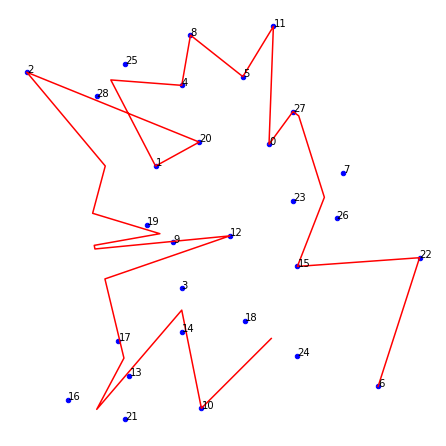

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000069,-0.000039
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 28000--------------'

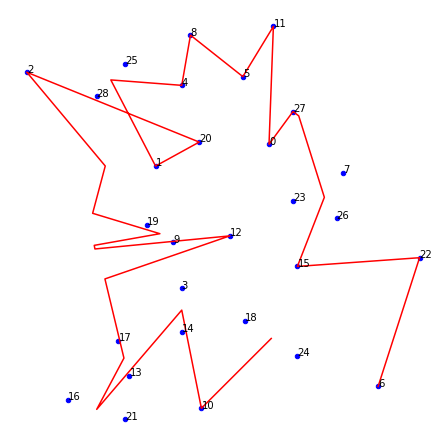

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000057,-0.000032
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 29000--------------'

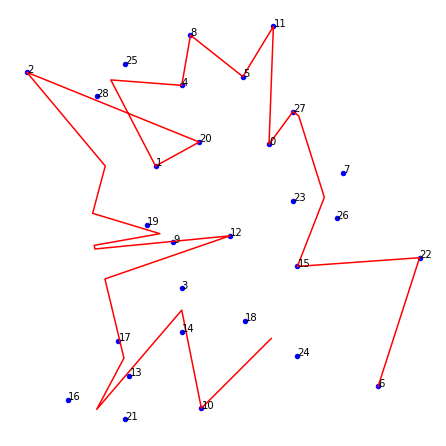

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000047,-0.000026
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 30000--------------'

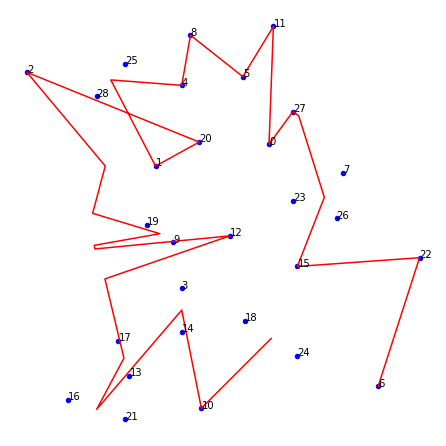

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000038,-0.000022
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 31000--------------'

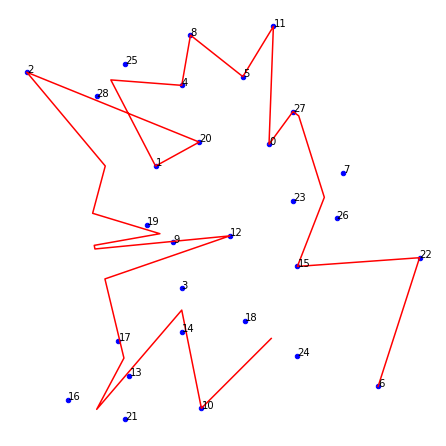

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000031,-0.000018
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 32000--------------'

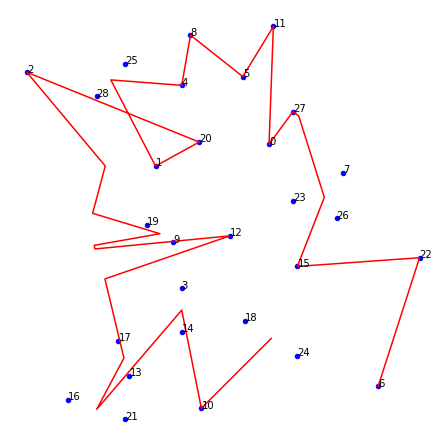

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000025,-0.000014
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 33000--------------'

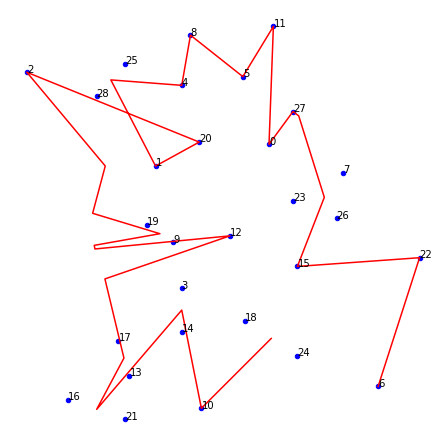

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000021,-0.000012
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


'-----------Iteration: 34000--------------'

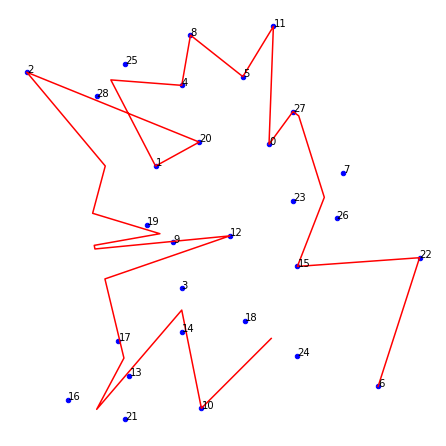

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,-0.000017,-0.000010
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.000000,0.000000


alpha:  0.000999864476057279
time:  21.19805778800003
Iterations:  34535
Cost:  25313.253184810335


'######### Result #########'

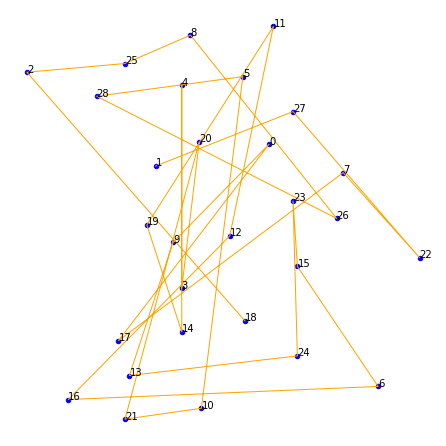

array([18,  2, 25,  8, 26, 28,  5, 10, 21, 20,  3,  4, 14, 19, 11, 12, 16,
        6, 15, 23, 24, 13,  9,  0, 17,  7, 22, 27,  1])

In [14]:
np.random.seed(2000)
som=SOM(cities=test1,alpha=1,alphaRate=0.9998,rRate=0.001)
som.run()

In [15]:
test2=OpenTest('2.tsp')
pd.DataFrame(test2)

,0,1
0,-50.0,23.8
1,11.8,54.0
2,-58.6,-29.9
3,73.7,102.6
4,-72.2,106.7
5,53.4,-8.2
6,96.5,100.0
7,34.1,18.2
8,-77.9,-94.7
9,16.4,-22.6


Radius:  5.862000000000001


'-----------Iteration: 0--------------'

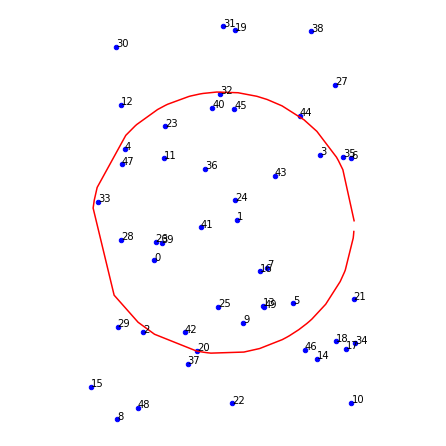

,0,1
0,0.000000,0.000000
1,0.187525,9.744800
2,-13.620677,4.427941
3,-12.140401,1.778471
4,-114.317648,-20.190842
5,23.005293,26.174527
6,21.568791,55.784091
7,24.389814,-11.975984
8,0.000000,0.000000
9,-2.579855,46.580299


'-----------Iteration: 1000--------------'

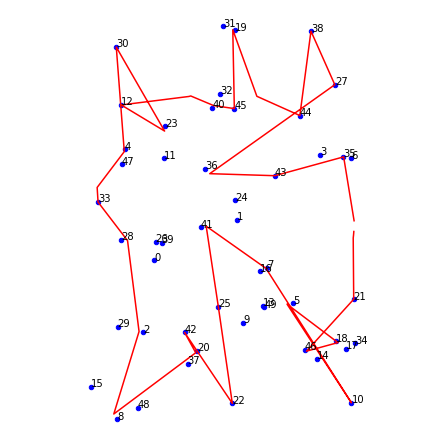

,0,1
0,0.000000,0.000000
1,-0.000138,-0.000067
2,0.000000,0.000000
3,0.000000,0.000000
4,0.002641,-0.002747
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.001033,0.000340


'-----------Iteration: 2000--------------'

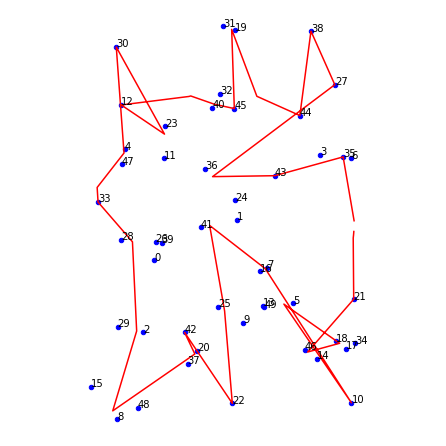

,0,1
0,0.000000,0.000000e+00
1,-0.000522,3.558844e-07
2,0.000000,0.000000e+00
3,0.000000,0.000000e+00
4,0.001706,-1.774608e-03
5,0.000000,0.000000e+00
6,0.000000,0.000000e+00
7,0.000000,0.000000e+00
8,0.000000,0.000000e+00
9,-0.000667,2.199301e-04


'-----------Iteration: 3000--------------'

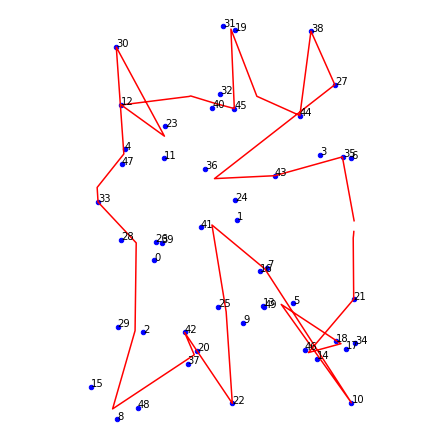

,0,1
0,0.000000,0.000000
1,-0.000576,0.000024
2,0.000000,0.000000
3,0.000000,0.000000
4,0.001173,-0.001220
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000459,0.000151


'-----------Iteration: 4000--------------'

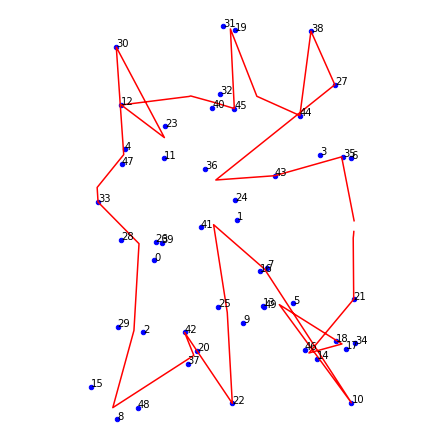

,0,1
0,0.000000,0.000000
1,-0.000524,0.000030
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000841,-0.000875
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000329,0.000108


'-----------Iteration: 5000--------------'

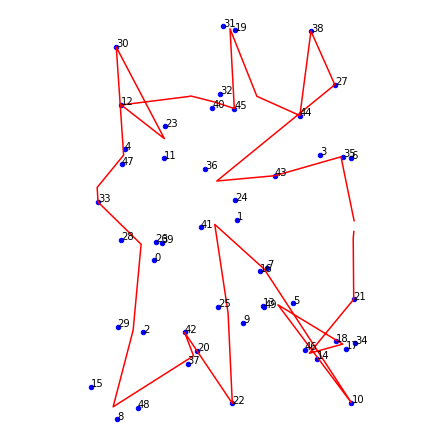

,0,1
0,0.000000,0.000000
1,-0.000446,0.000029
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000621,-0.000646
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000243,0.000080


'-----------Iteration: 6000--------------'

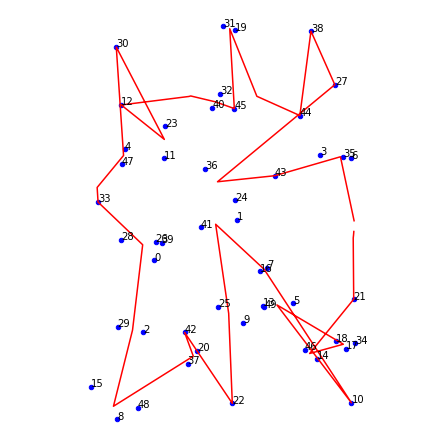

,0,1
0,0.000000,0.000000
1,-0.000369,0.000026
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000470,-0.000488
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000184,0.000061


'-----------Iteration: 7000--------------'

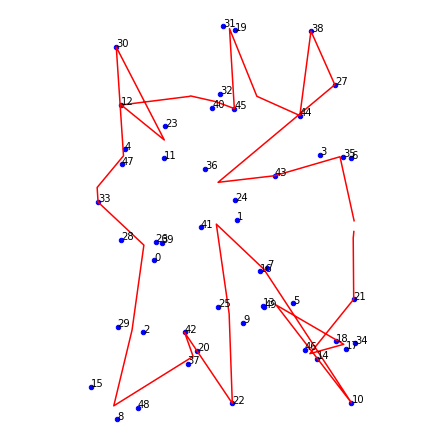

,0,1
0,0.000000,0.000000
1,-0.000302,0.000022
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000361,-0.000375
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000141,0.000047


'-----------Iteration: 8000--------------'

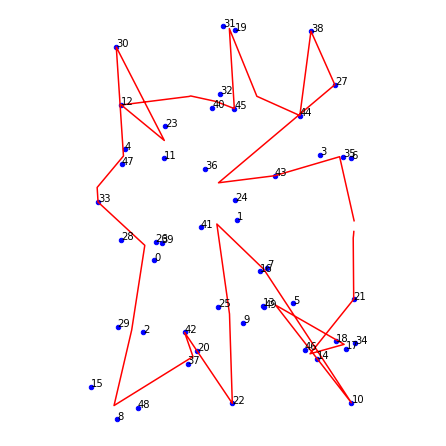

,0,1
0,0.000000,0.000000
1,-0.000246,0.000018
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000281,-0.000292
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000110,0.000036


'-----------Iteration: 9000--------------'

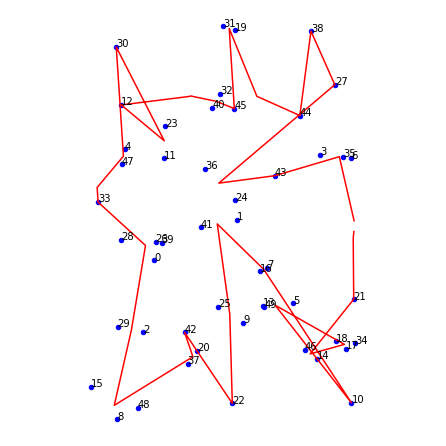

,0,1
0,0.000000,0.000000
1,-0.000200,0.000015
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000221,-0.000230
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000086,0.000028


'-----------Iteration: 10000--------------'

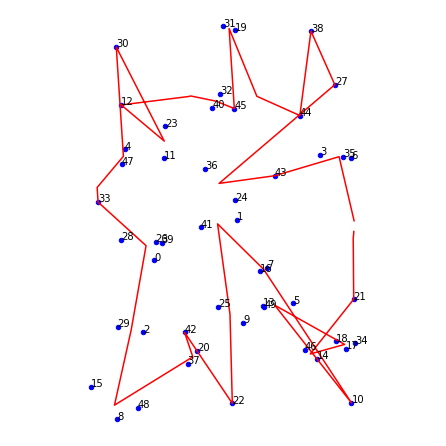

,0,1
0,0.000000,0.000000
1,-0.000162,0.000013
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000175,-0.000182
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000069,0.000023


'-----------Iteration: 11000--------------'

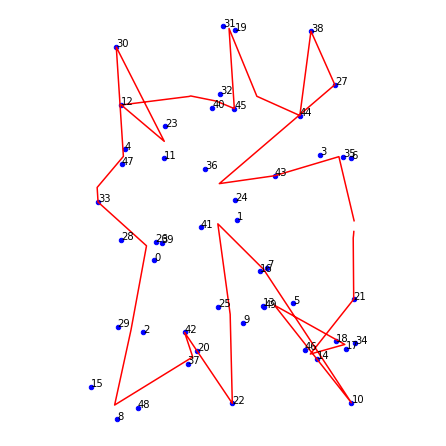

,0,1
0,0.000000,0.000000
1,-0.000132,0.000010
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000140,-0.000145
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000055,0.000018


'-----------Iteration: 12000--------------'

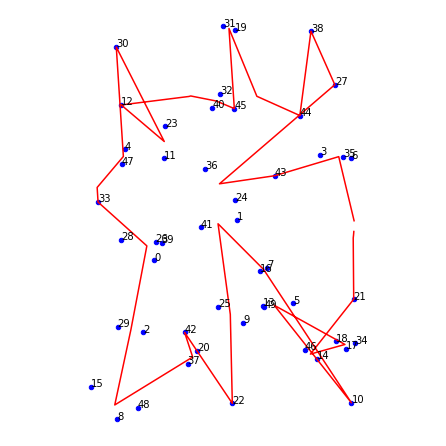

,0,1
0,0.000000,0.000000
1,-0.000107,0.000008
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000112,-0.000116
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000044,0.000014


'-----------Iteration: 13000--------------'

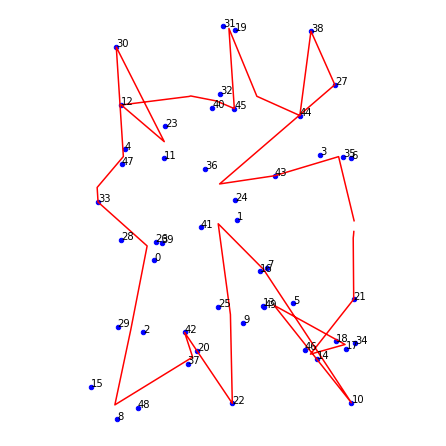

,0,1
0,0.000000,0.000000
1,-0.000087,0.000007
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000090,-0.000094
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000035,0.000012


'-----------Iteration: 14000--------------'

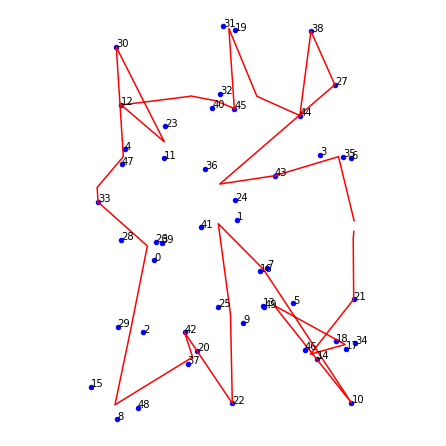

,0,1
0,0.000000,0.000000
1,-0.000071,0.000006
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000073,-0.000076
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000028,0.000009


'-----------Iteration: 15000--------------'

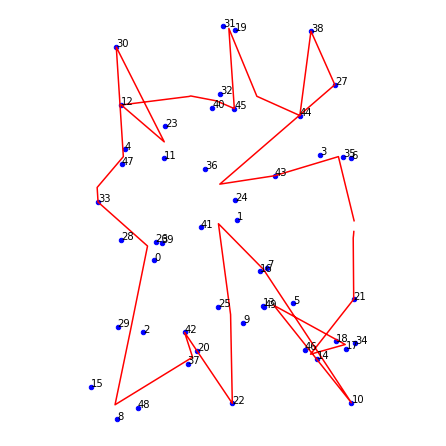

,0,1
0,0.000000,0.000000
1,-0.000058,0.000005
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000059,-0.000061
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000023,0.000008


'-----------Iteration: 16000--------------'

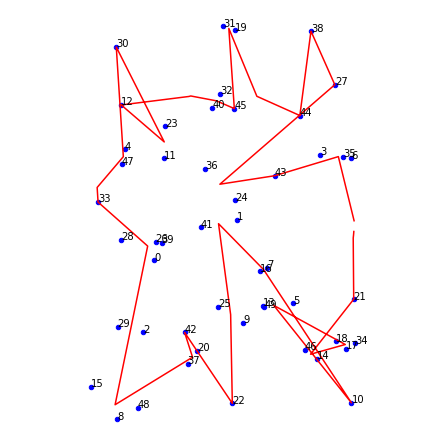

,0,1
0,0.000000,0.000000
1,-0.000047,0.000004
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000048,-0.000050
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000019,0.000006


'-----------Iteration: 17000--------------'

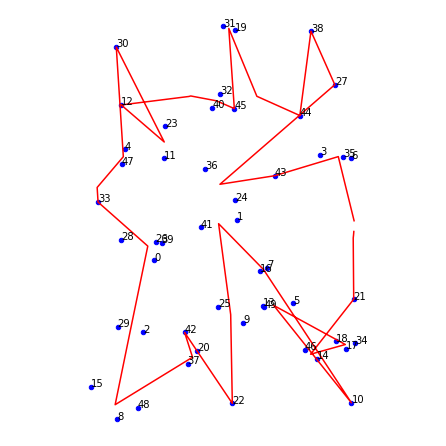

,0,1
0,0.000000,0.000000
1,-0.000039,0.000003
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000039,-0.000040
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000015,0.000005


'-----------Iteration: 18000--------------'

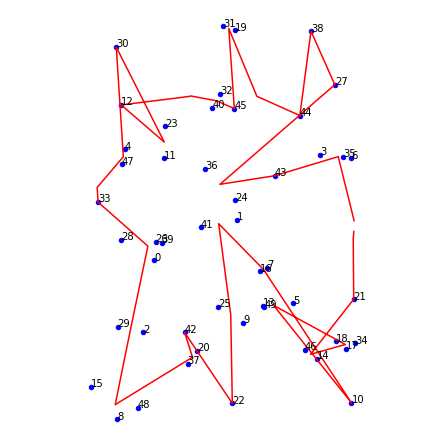

,0,1
0,0.000000,0.000000
1,-0.000032,0.000003
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000032,-0.000033
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000012,0.000004


'-----------Iteration: 19000--------------'

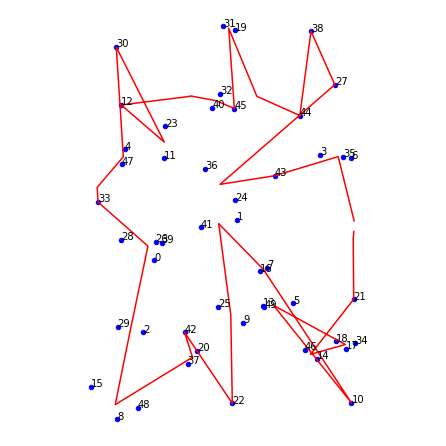

,0,1
0,0.000000e+00,0.000000
1,-2.574438e-05,0.000002
2,0.000000e+00,0.000000
3,0.000000e+00,0.000000
4,2.573360e-05,-0.000027
5,0.000000e+00,0.000000
6,0.000000e+00,0.000000
7,0.000000e+00,0.000000
8,0.000000e+00,0.000000
9,-1.006470e-05,0.000003


'-----------Iteration: 20000--------------'

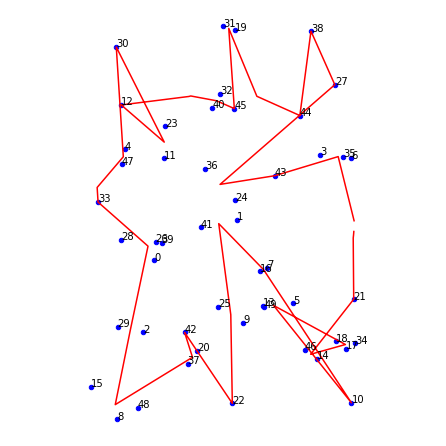

,0,1
0,0.000000e+00,0.000000
1,-2.104091e-05,0.000002
2,0.000000e+00,0.000000
3,0.000000e+00,0.000000
4,2.098235e-05,-0.000022
5,0.000000e+00,0.000000
6,0.000000e+00,0.000000
7,0.000000e+00,0.000000
8,0.000000e+00,0.000000
9,-8.206432e-06,0.000003


'-----------Iteration: 21000--------------'

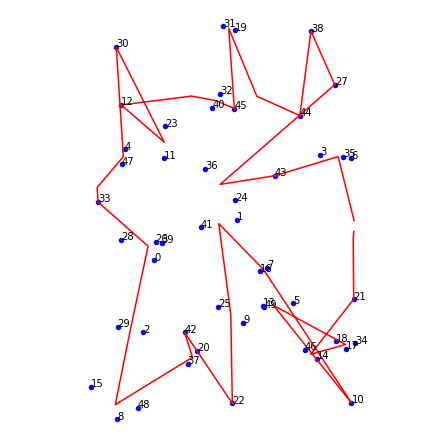

,0,1
0,0.000000e+00,0.000000
1,-1.720195e-05,0.000001
2,0.000000e+00,0.000000
3,0.000000e+00,0.000000
4,1.712115e-05,-0.000018
5,0.000000e+00,0.000000
6,0.000000e+00,0.000000
7,0.000000e+00,0.000000
8,0.000000e+00,0.000000
9,-6.696274e-06,0.000002


'-----------Iteration: 22000--------------'

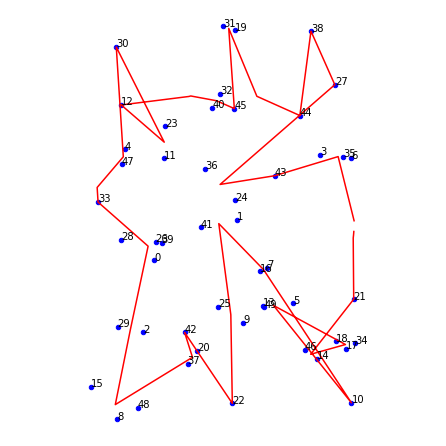

,0,1
0,0.000000e+00,0.000000
1,-1.406695e-05,0.000001
2,0.000000e+00,0.000000
3,0.000000e+00,0.000000
4,1.397903e-05,-0.000015
5,0.000000e+00,0.000000
6,0.000000e+00,0.000000
7,0.000000e+00,0.000000
8,0.000000e+00,0.000000
9,-5.467356e-06,0.000002


'-----------Iteration: 23000--------------'

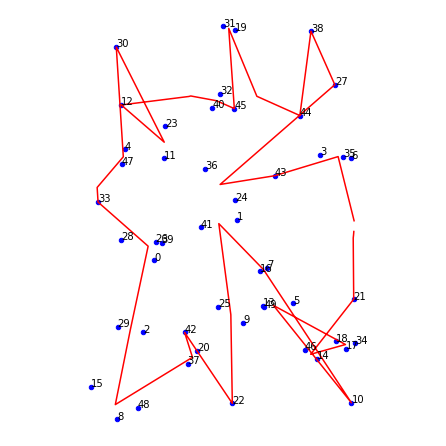

,0,1
0,0.000000e+00,0.000000e+00
1,-1.150568e-05,9.386231e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,1.141926e-05,-1.187603e-05
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-4.466199e-06,1.471816e-06


'-----------Iteration: 24000--------------'

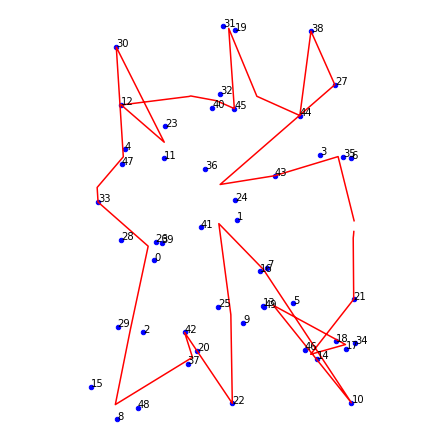

,0,1
0,0.000000e+00,0.000000e+00
1,-9.412384e-06,7.683534e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,9.332019e-06,-9.705300e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-3.649857e-06,1.202794e-06


'-----------Iteration: 25000--------------'

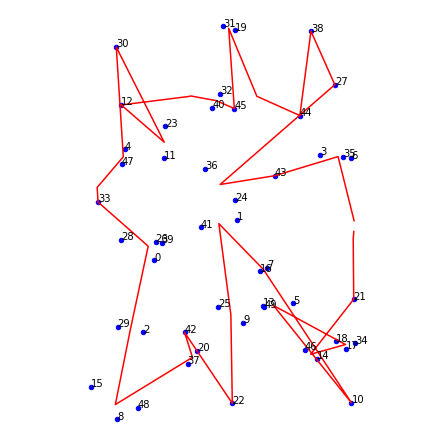

,0,1
0,0.000000e+00,0.000000e+00
1,-7.701024e-06,6.289849e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,7.628830e-06,-7.933984e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-2.983720e-06,9.832715e-07


'-----------Iteration: 26000--------------'

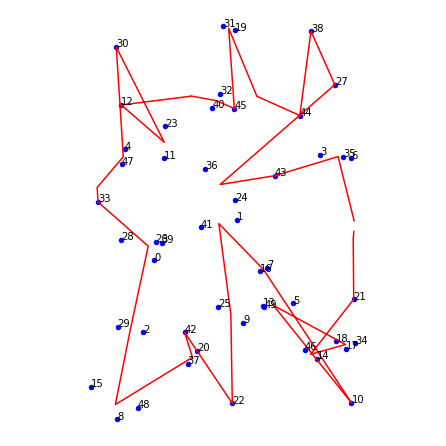

,0,1
0,0.000000e+00,0.000000e+00
1,-6.301560e-06,5.149059e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,6.238189e-06,-6.487716e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-2.439825e-06,8.040332e-07


'-----------Iteration: 27000--------------'

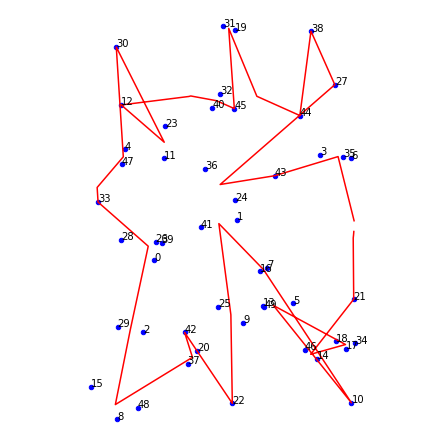

,0,1
0,0.000000e+00,0.000000e+00
1,-5.156909e-06,4.215244e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,5.102179e-06,-5.306266e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.995519e-06,6.576142e-07


'-----------Iteration: 28000--------------'

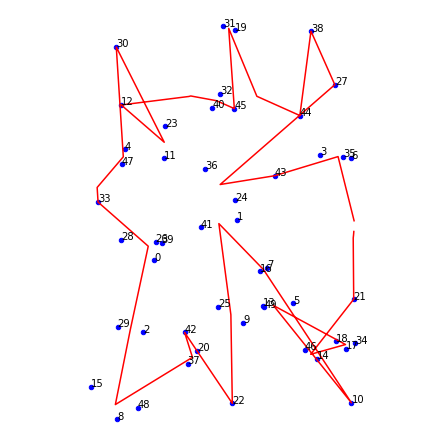

,0,1
0,0.000000e+00,0.000000e+00
1,-4.220512e-06,3.450832e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,4.173803e-06,-4.340755e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.632421e-06,5.379569e-07


'-----------Iteration: 29000--------------'

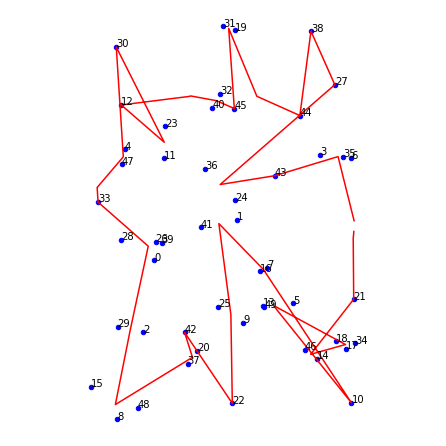

,0,1
0,0.000000e+00,0.000000e+00
1,-3.454372e-06,2.825077e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,3.414860e-06,-3.551454e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.335590e-06,4.401375e-07


'-----------Iteration: 30000--------------'

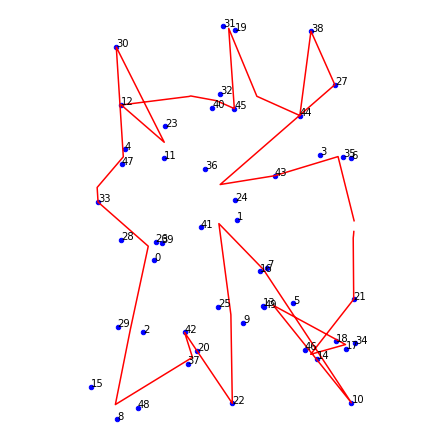

,0,1
0,0.000000e+00,0.000000e+00
1,-2.827458e-06,2.312816e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,2.794260e-06,-2.906030e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.092866e-06,3.601490e-07


'-----------Iteration: 31000--------------'

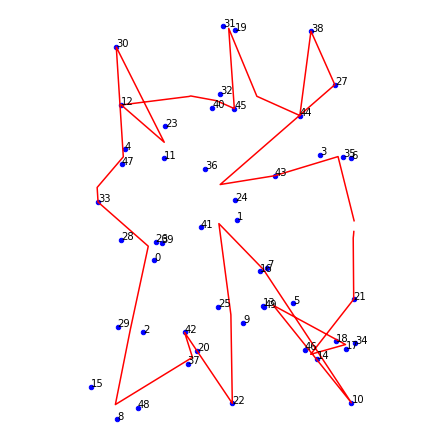

,0,1
0,0.000000e+00,0.000000e+00
1,-2.314421e-06,1.893458e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,2.286672e-06,-2.378139e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-8.943429e-07,2.947266e-07


'-----------Iteration: 32000--------------'

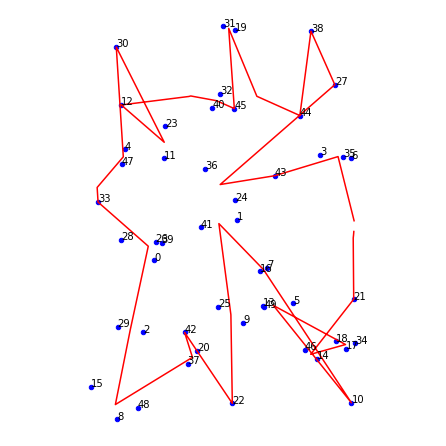

,0,1
0,0.000000e+00,0.000000e+00
1,-1.894541e-06,1.550149e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,1.871442e-06,-1.946300e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-7.319419e-07,2.412082e-07


'-----------Iteration: 33000--------------'

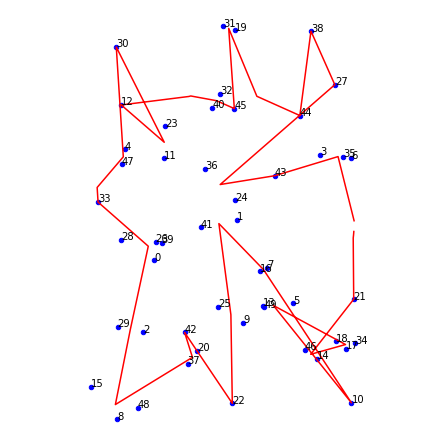

,0,1
0,0.000000e+00,0.000000e+00
1,-1.550881e-06,1.269094e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,1.531715e-06,-1.592984e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-5.990709e-07,1.974211e-07


'-----------Iteration: 34000--------------'

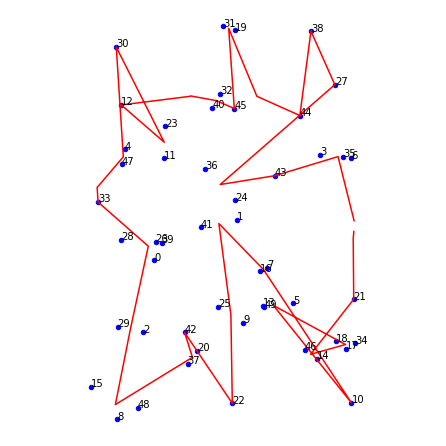

,0,1
0,0.000000e+00,0.000000e+00
1,-1.269590e-06,1.039002e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,1.253728e-06,-1.303877e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-4.903470e-07,1.615916e-07


alpha:  0.000999864476057279
time:  36.14660685299998
Iterations:  34535
Cost:  5809.31146641797


'######### Result #########'

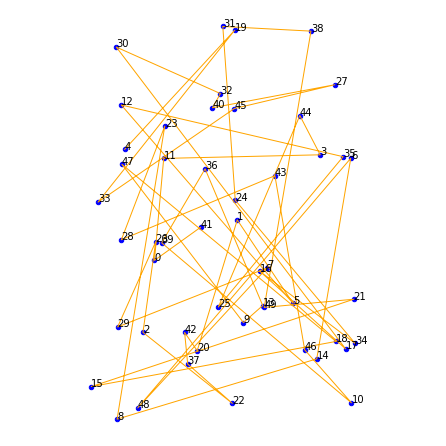

array([41,  0, 11,  3, 44, 25, 35, 12,  5,  1, 20, 42, 37, 22,  2, 26, 29,
        7, 48,  6, 14,  8, 23, 28, 43, 46, 10, 39, 36, 13,  9, 47, 18, 15,
       21, 49, 38, 31, 24, 34, 16, 17, 30, 32, 40, 27, 45, 33, 19,  4])

In [17]:
np.random.seed(1999)
som=SOM(cities=test2,alpha=1,alphaRate=0.9998,rRate=0.02)
som.run()

here we find rRate=0.02 is better so we cant say if rRate is lower is good, always !

Radius:  0.5862


'-----------Iteration: 0--------------'

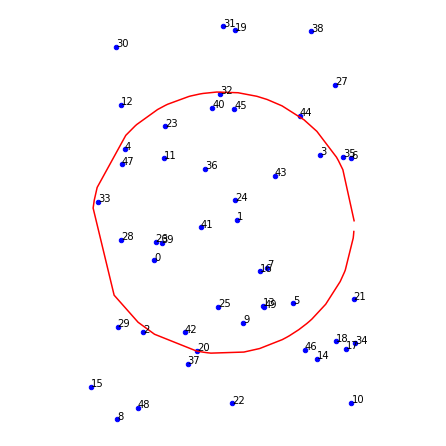

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,3.479323,3.027941
3,-12.140401,1.778471
4,-114.317648,-20.190842
5,23.005293,26.174527
6,21.568791,55.784091
7,24.389814,-11.975984
8,0.000000,0.000000
9,-2.579855,46.580299


'-----------Iteration: 1000--------------'

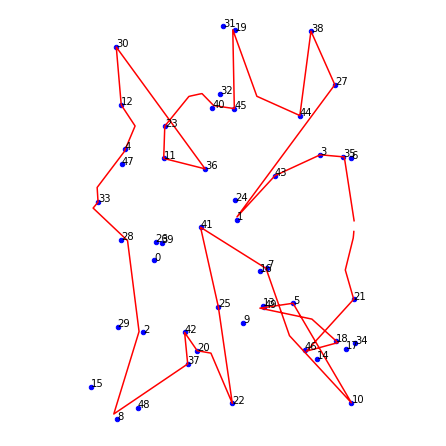

,0,1
0,0.000000,0.000000
1,0.000669,-0.000141
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000176,0.001725
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.001033,0.000340


'-----------Iteration: 2000--------------'

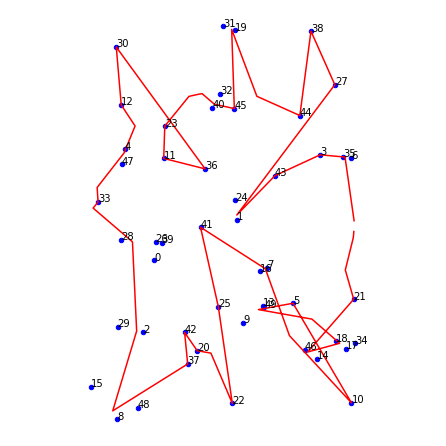

,0,1
0,0.000000,0.000000
1,0.000432,-0.000091
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000114,0.001115
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000667,0.000220


'-----------Iteration: 3000--------------'

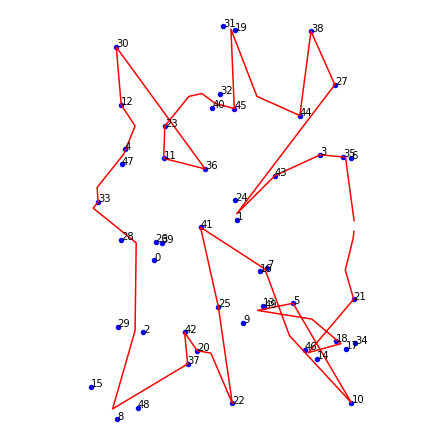

,0,1
0,0.000000,0.000000
1,0.000297,-0.000063
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000078,0.000766
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000459,0.000151


'-----------Iteration: 4000--------------'

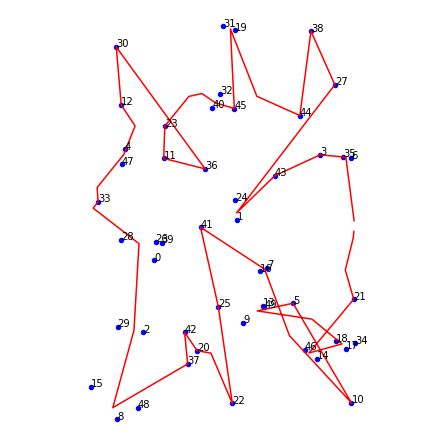

,0,1
0,0.000000,0.000000
1,0.000213,-0.000045
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000056,0.000549
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000329,0.000108


'-----------Iteration: 5000--------------'

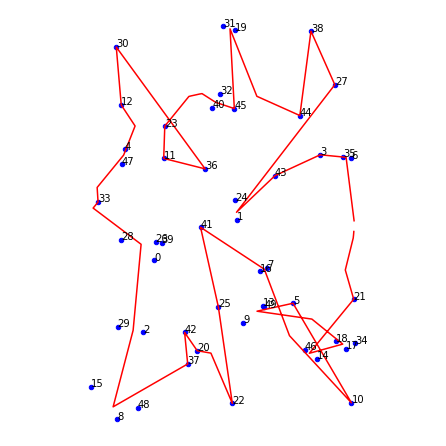

,0,1
0,0.000000,0.000000
1,0.000157,-0.000033
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000041,0.000406
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000243,0.000080


'-----------Iteration: 6000--------------'

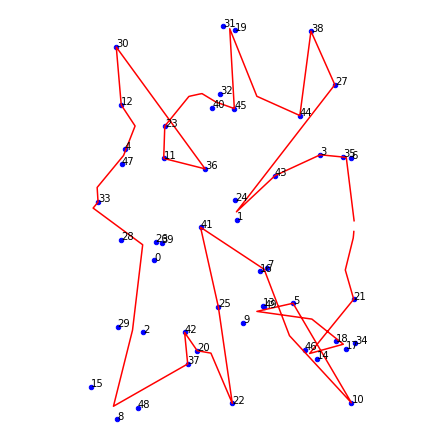

,0,1
0,0.000000,0.000000
1,0.000119,-0.000025
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000031,0.000307
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000184,0.000061


'-----------Iteration: 7000--------------'

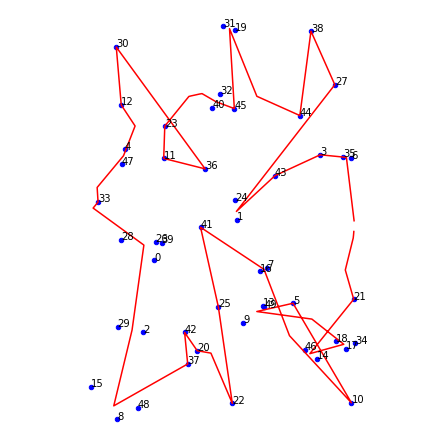

,0,1
0,0.000000,0.000000
1,0.000091,-0.000019
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000024,0.000236
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000141,0.000047


'-----------Iteration: 8000--------------'

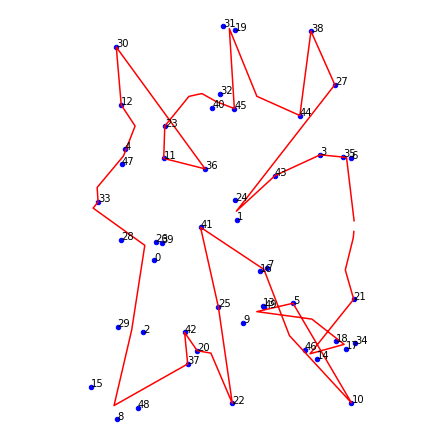

,0,1
0,0.000000,0.000000
1,0.000071,-0.000015
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000019,0.000184
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000110,0.000036


'-----------Iteration: 9000--------------'

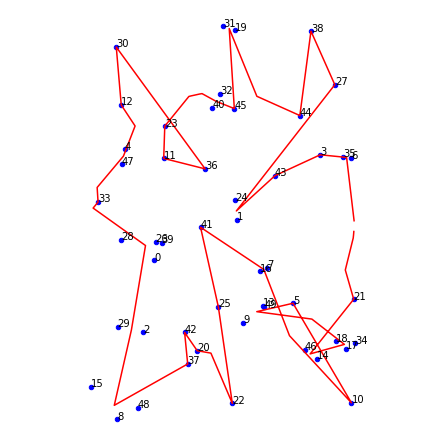

,0,1
0,0.000000,0.000000
1,0.000056,-0.000012
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000015,0.000144
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000086,0.000028


'-----------Iteration: 10000--------------'

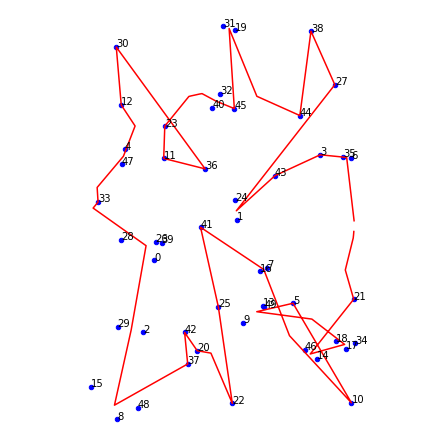

,0,1
0,0.000000,0.000000
1,0.000044,-0.000009
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000012,0.000114
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000069,0.000023


'-----------Iteration: 11000--------------'

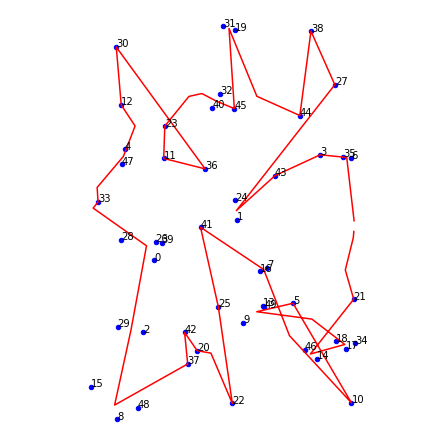

,0,1
0,0.000000e+00,0.000000
1,3.538863e-05,-0.000007
2,0.000000e+00,0.000000
3,0.000000e+00,0.000000
4,-9.312797e-06,0.000091
5,0.000000e+00,0.000000
6,0.000000e+00,0.000000
7,0.000000e+00,0.000000
8,0.000000e+00,0.000000
9,-5.463507e-05,0.000018


'-----------Iteration: 12000--------------'

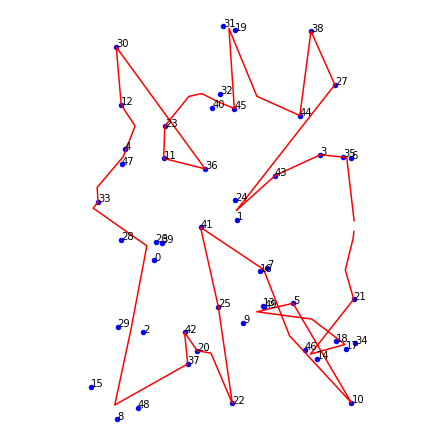

,0,1
0,0.000000,0.000000
1,0.000028,-0.000006
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000007,0.000073
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000044,0.000014


'-----------Iteration: 13000--------------'

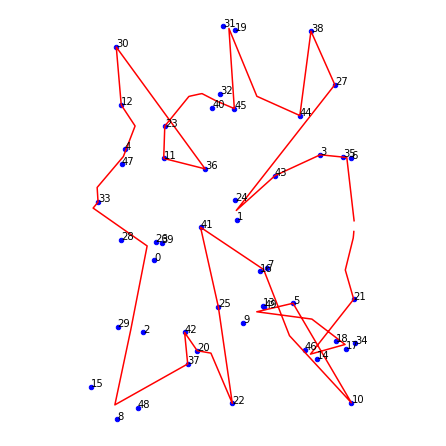

,0,1
0,0.000000,0.000000
1,0.000023,-0.000005
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000006,0.000059
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000035,0.000012


'-----------Iteration: 14000--------------'

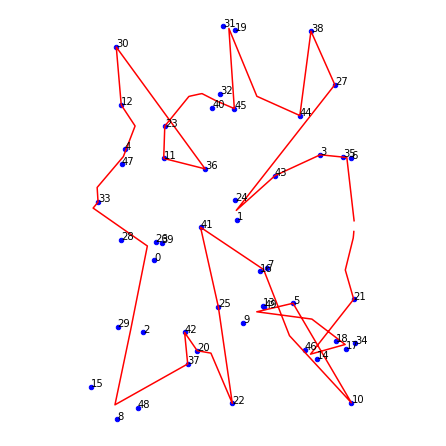

,0,1
0,0.000000,0.000000
1,0.000018,-0.000004
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000005,0.000048
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000028,0.000009


'-----------Iteration: 15000--------------'

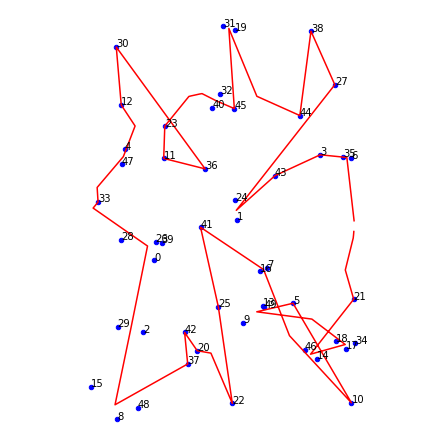

,0,1
0,0.000000,0.000000
1,0.000015,-0.000003
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000004,0.000038
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000023,0.000008


'-----------Iteration: 16000--------------'

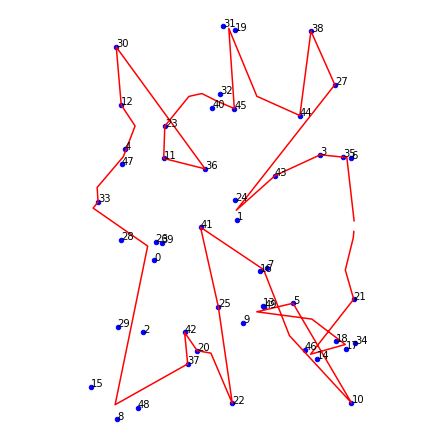

,0,1
0,0.000000,0.000000
1,0.000012,-0.000003
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000003,0.000031
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000019,0.000006


'-----------Iteration: 17000--------------'

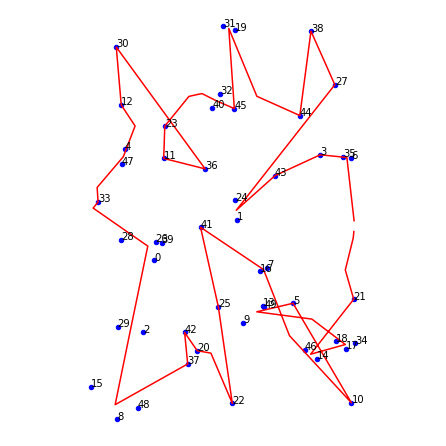

,0,1
0,0.000000,0.000000
1,0.000010,-0.000002
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000003,0.000025
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000015,0.000005


'-----------Iteration: 18000--------------'

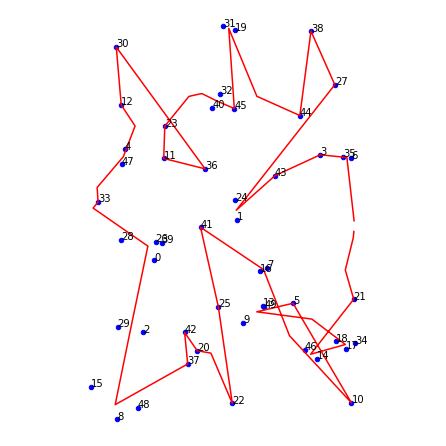

,0,1
0,0.000000,0.000000
1,0.000008,-0.000002
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000002,0.000021
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000012,0.000004


'-----------Iteration: 19000--------------'

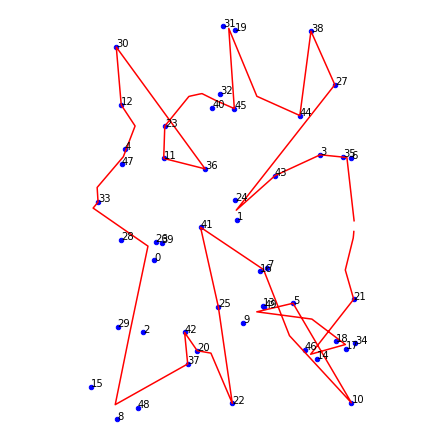

,0,1
0,0.000000,0.000000
1,0.000007,-0.000001
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000002,0.000017
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000010,0.000003


'-----------Iteration: 20000--------------'

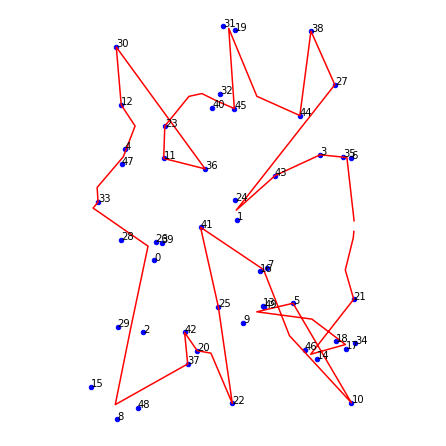

,0,1
0,0.000000,0.000000
1,0.000005,-0.000001
2,0.000000,0.000000
3,0.000000,0.000000
4,-0.000001,0.000014
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,-0.000008,0.000003


'-----------Iteration: 21000--------------'

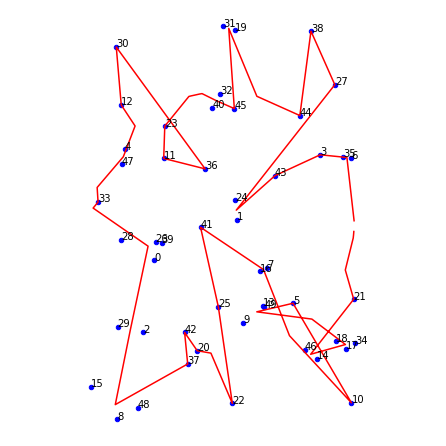

,0,1
0,0.000000e+00,0.000000e+00
1,4.337359e-06,-9.131282e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-1.141410e-06,1.118582e-05
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-6.696274e-06,2.206726e-06


'-----------Iteration: 22000--------------'

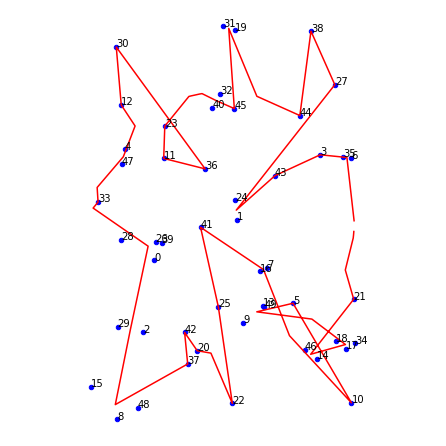

,0,1
0,0.000000e+00,0.000000e+00
1,3.541355e-06,-7.455485e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-9.319356e-07,9.132969e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-5.467356e-06,1.801742e-06


'-----------Iteration: 23000--------------'

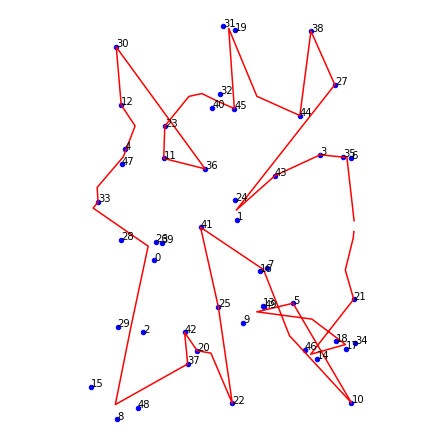

,0,1
0,0.000000e+00,0.000000e+00
1,2.892879e-06,-6.090271e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-7.612839e-07,7.460583e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-4.466199e-06,1.471816e-06


'-----------Iteration: 24000--------------'

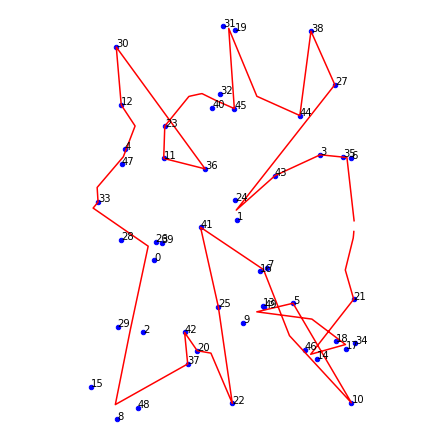

,0,1
0,0.000000e+00,0.000000e+00
1,2.364112e-06,-4.977077e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-6.221346e-07,6.096919e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-3.649857e-06,1.202794e-06


'-----------Iteration: 25000--------------'

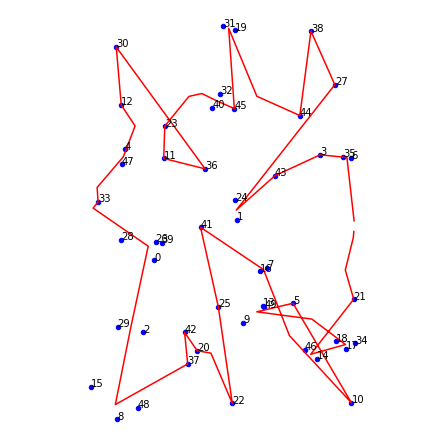

,0,1
0,0.000000e+00,0.000000e+00
1,1.932637e-06,-4.068710e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-5.085887e-07,4.984169e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-2.983720e-06,9.832715e-07


'-----------Iteration: 26000--------------'

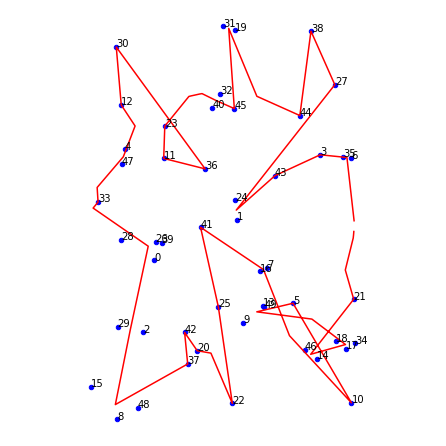

,0,1
0,0.000000e+00,0.000000e+00
1,1.580341e-06,-3.327034e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-4.158792e-07,4.075617e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-2.439825e-06,8.040332e-07


'-----------Iteration: 27000--------------'

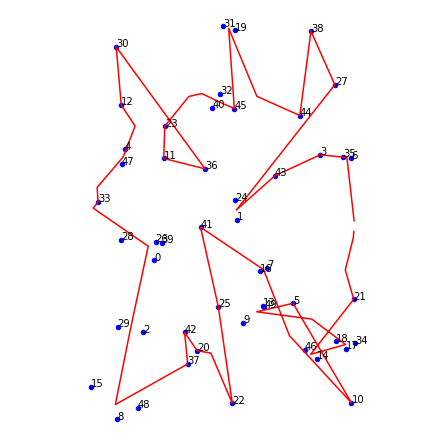

,0,1
0,0.000000e+00,0.000000e+00
1,1.292552e-06,-2.721162e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-3.401453e-07,3.333424e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.995519e-06,6.576142e-07


'-----------Iteration: 28000--------------'

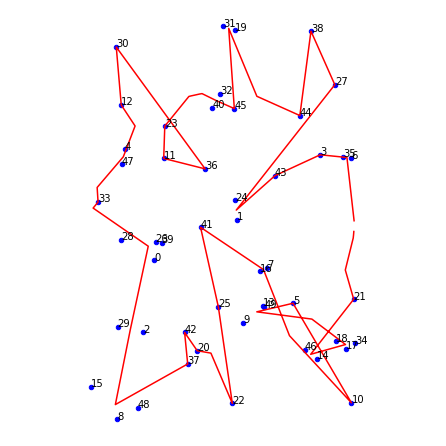

,0,1
0,0.000000e+00,0.000000e+00
1,1.057363e-06,-2.226028e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-2.782535e-07,2.726885e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.632421e-06,5.379569e-07


'-----------Iteration: 29000--------------'

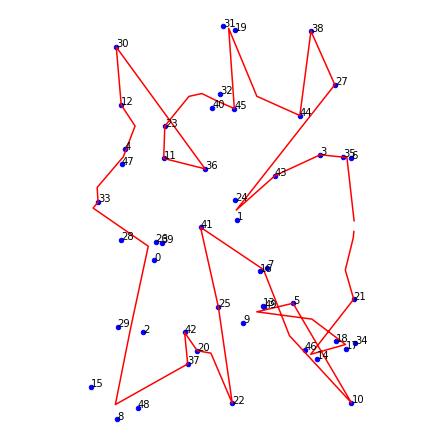

,0,1
0,0.000000e+00,0.000000e+00
1,8.650979e-07,-1.821259e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-2.276573e-07,2.231042e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.335590e-06,4.401375e-07


'-----------Iteration: 30000--------------'

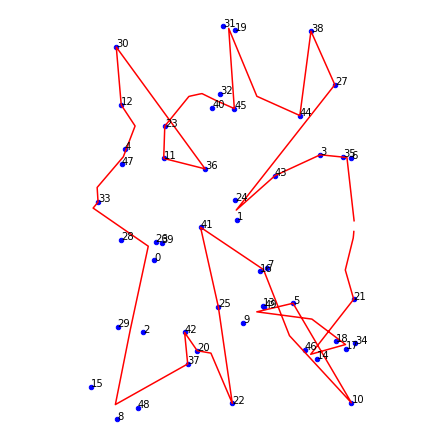

,0,1
0,0.000000e+00,0.000000e+00
1,7.078791e-07,-1.490272e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-1.862840e-07,1.825583e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-1.092866e-06,3.601490e-07


'-----------Iteration: 31000--------------'

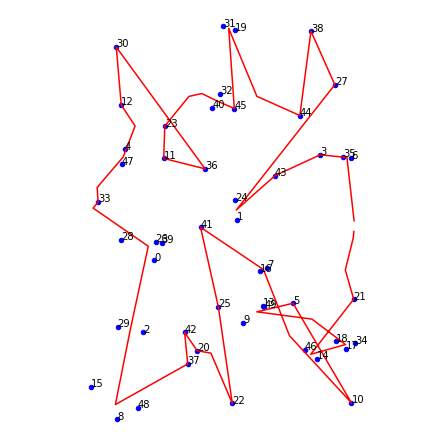

,0,1
0,0.000000e+00,0.000000e+00
1,5.792903e-07,-1.219558e-07
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-1.524448e-07,1.493959e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-8.943429e-07,2.947266e-07


'-----------Iteration: 32000--------------'

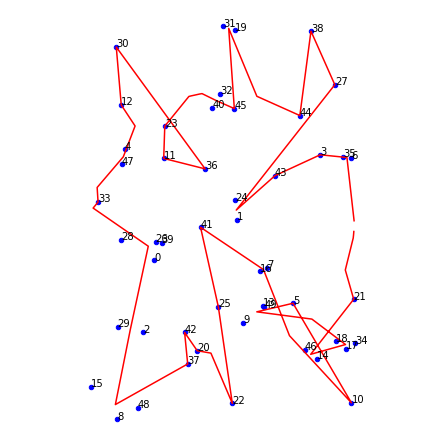

,0,1
0,0.000000e+00,0.000000e+00
1,4.740988e-07,-9.981025e-08
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-1.247628e-07,1.222676e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-7.319419e-07,2.412082e-07


'-----------Iteration: 33000--------------'

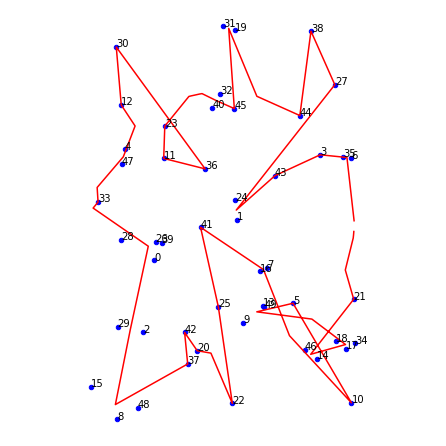

,0,1
0,0.000000e+00,0.000000e+00
1,3.880346e-07,-8.169150e-08
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-1.021144e-07,1.000721e-06
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-5.990709e-07,1.974211e-07


'-----------Iteration: 34000--------------'

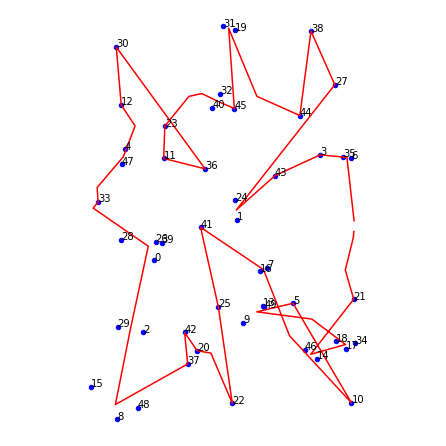

,0,1
0,0.000000e+00,0.000000e+00
1,3.176111e-07,-6.686548e-08
2,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00
4,-8.358188e-08,8.191024e-07
5,0.000000e+00,0.000000e+00
6,0.000000e+00,0.000000e+00
7,0.000000e+00,0.000000e+00
8,0.000000e+00,0.000000e+00
9,-4.903470e-07,1.615916e-07


alpha:  0.000999864476057279
time:  37.225085131000014
Iterations:  34535
Cost:  6113.548553020244


'######### Result #########'

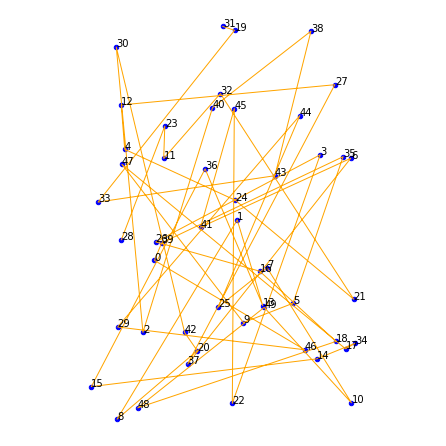

array([28, 23, 11, 32, 21, 24,  4, 12, 27, 37,  6, 41, 45, 22,  3, 26, 16,
       18, 48, 49, 10,  7, 25, 44, 29, 46,  0, 39, 35,  5,  9, 47, 17, 34,
       14, 15, 36, 13,  1,  8, 20, 42, 30,  2, 40, 38, 43, 33, 19, 31])

In [18]:
np.random.seed(1999)
som=SOM(cities=test2,alpha=1,alphaRate=0.9998,rRate=0.002)
som.run()

In [19]:
test3=OpenTest('3.tsp')
pd.DataFrame(test3)

,0,1
0,-94.9,-49.8
1,-104.0,79.4
2,2.7,178.4
3,-111.8,184.7
4,154.7,-144.6
...,...,...
316,154.2,187.8
317,-51.2,-8.1
318,170.7,-115.8
319,-71.2,-65.2


Radius:  1.2694400000000001


'-----------Iteration: 0--------------'

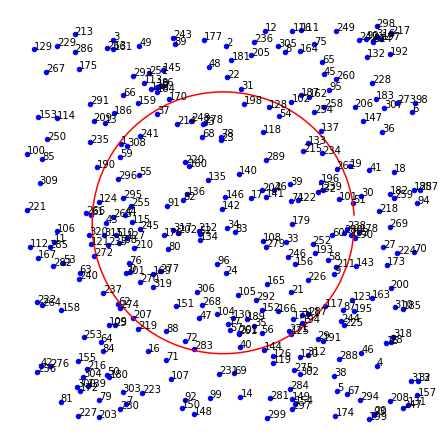

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
...,...,...
316,5.478312,0.223180
317,-9.870345,-3.686594
318,42.948195,-26.207269
319,42.941690,-26.396292


'-----------Iteration: 1000--------------'

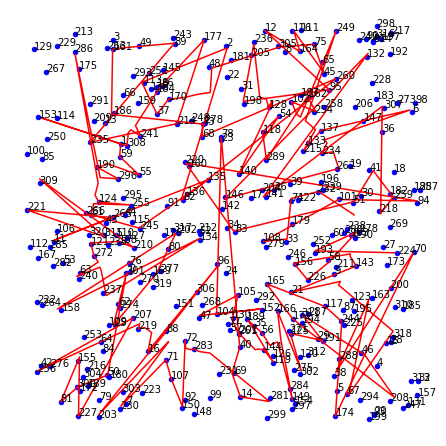

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000723,0.000680
3,0.000215,0.001847
4,0.000693,0.002125
...,...,...
316,-0.002125,-0.000302
317,0.000506,0.001734
318,-0.001883,0.000127
319,-0.001883,0.000127


'-----------Iteration: 2000--------------'

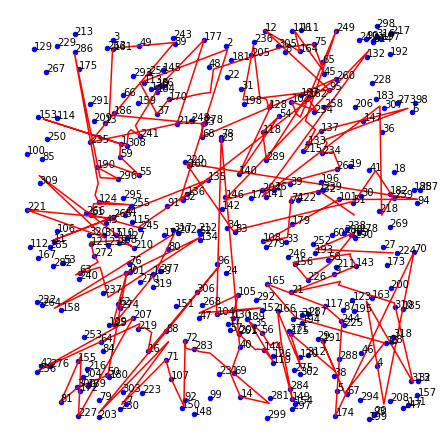

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000467,0.000643
3,0.000288,0.001011
4,0.000447,0.001373
...,...,...
316,-0.001475,-0.000249
317,0.000727,0.001395
318,-0.001264,-0.000241
319,-0.001264,-0.000241


'-----------Iteration: 3000--------------'

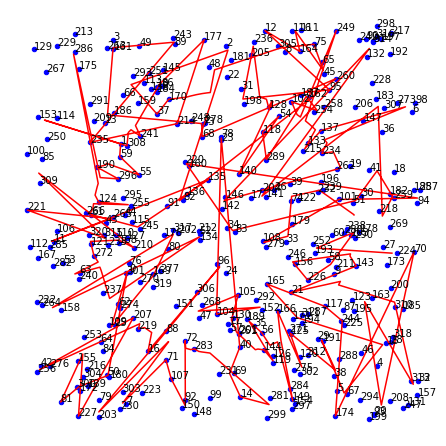

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000309,0.000534
3,0.000270,0.000571
4,0.000308,0.000943
...,...,...
316,-0.000998,-0.000200
317,0.000695,0.001069
318,-0.000860,-0.000332
319,-0.000860,-0.000332


'-----------Iteration: 4000--------------'

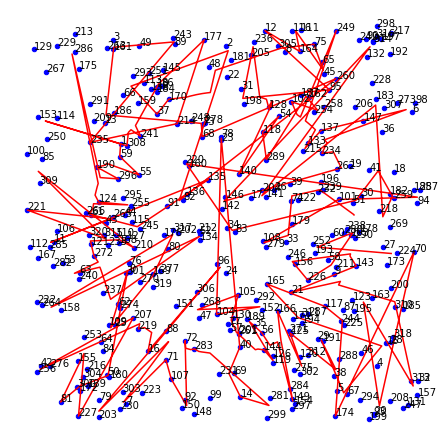

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000210,0.000426
3,0.000230,0.000334
4,0.000221,0.000676
...,...,...
316,-0.000667,-0.000161
317,0.000595,0.000812
318,-0.000600,-0.000324
319,-0.000600,-0.000324


'-----------Iteration: 5000--------------'

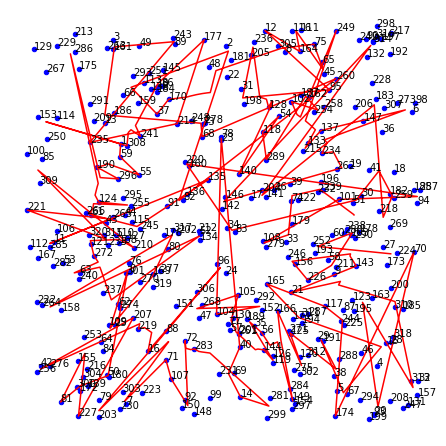

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000148,0.000336
3,0.000188,0.000202
4,0.000163,0.000500
...,...,...
316,-0.000445,-0.000130
317,0.000490,0.000620
318,-0.000430,-0.000286
319,-0.000430,-0.000286


'-----------Iteration: 6000--------------'

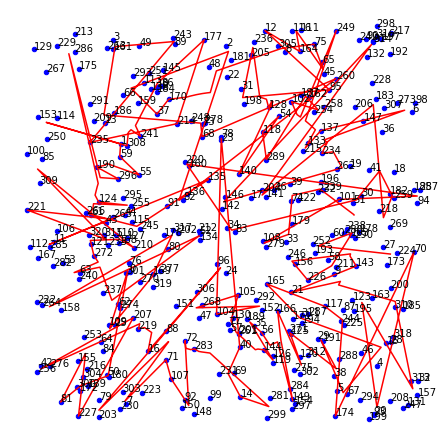

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000107,0.000265
3,0.000152,0.000126
4,0.000123,0.000378
...,...,...
316,-0.000301,-0.000106
317,0.000398,0.000478
318,-0.000316,-0.000242
319,-0.000316,-0.000242


'-----------Iteration: 7000--------------'

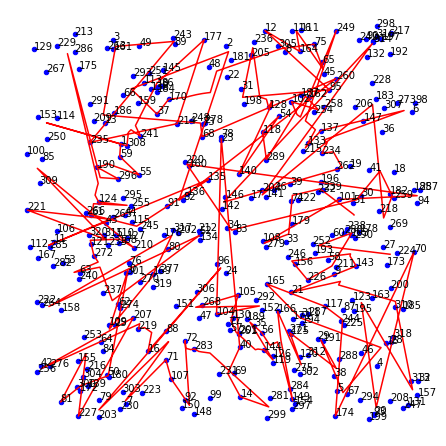

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000079,0.000209
3,0.000123,0.000080
4,0.000095,0.000290
...,...,...
316,-0.000206,-0.000086
317,0.000321,0.000371
318,-0.000236,-0.000200
319,-0.000236,-0.000200


'-----------Iteration: 8000--------------'

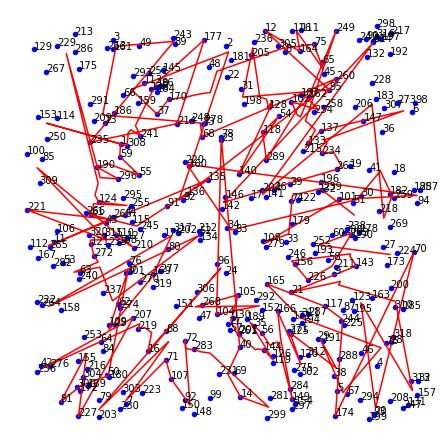

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000059,0.000166
3,0.000099,0.000052
4,0.000074,0.000226
...,...,...
316,-0.000144,-0.000070
317,0.000259,0.000291
318,-0.000180,-0.000165
319,-0.000180,-0.000165


'-----------Iteration: 9000--------------'

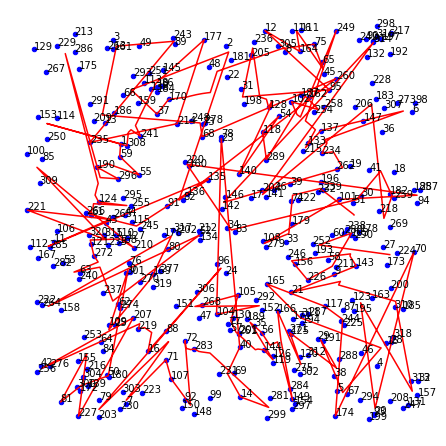

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000045,0.000133
3,0.000079,0.000035
4,0.000058,0.000178
...,...,...
316,-0.000102,-0.000057
317,0.000209,0.000230
318,-0.000138,-0.000135
319,-0.000138,-0.000135


'-----------Iteration: 10000--------------'

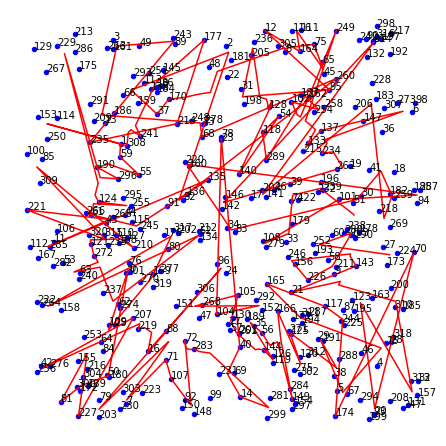

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000035,0.000106
3,0.000064,0.000024
4,0.000046,0.000141
...,...,...
316,-0.000074,-0.000046
317,0.000169,0.000183
318,-0.000108,-0.000110
319,-0.000108,-0.000110


'-----------Iteration: 11000--------------'

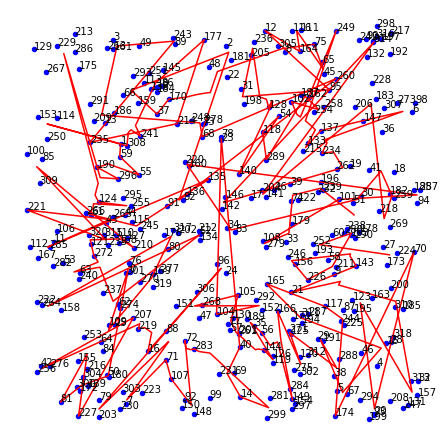

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000027,0.000085
3,0.000052,0.000016
4,0.000037,0.000112
...,...,...
316,-0.000054,-0.000037
317,0.000136,0.000146
318,-0.000085,-0.000090
319,-0.000085,-0.000090


'-----------Iteration: 12000--------------'

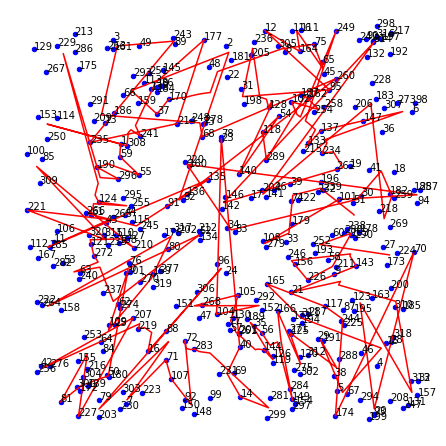

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000022,0.000069
3,0.000042,0.000012
4,0.000029,0.000090
...,...,...
316,-0.000041,-0.000031
317,0.000111,0.000117
318,-0.000067,-0.000073
319,-0.000067,-0.000073


'-----------Iteration: 13000--------------'

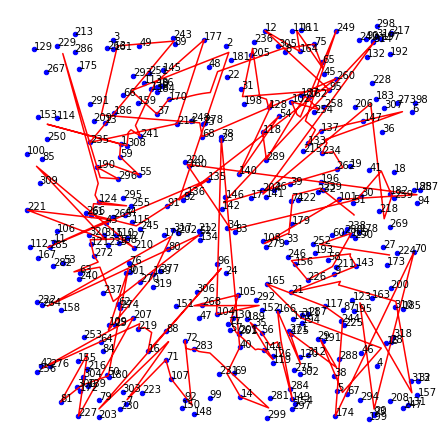

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000017,0.000056
3,0.000034,0.000008
4,0.000024,0.000072
...,...,...
316,-0.000031,-0.000025
317,0.000090,0.000094
318,-0.000054,-0.000060
319,-0.000054,-0.000060


'-----------Iteration: 14000--------------'

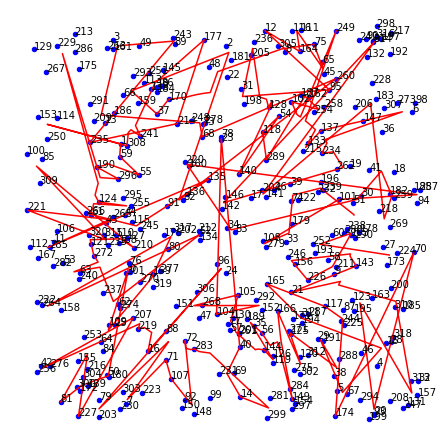

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000014,0.000045
3,0.000028,0.000006
4,0.000019,0.000059
...,...,...
316,-0.000024,-0.000020
317,0.000073,0.000076
318,-0.000043,-0.000049
319,-0.000043,-0.000049


'-----------Iteration: 15000--------------'

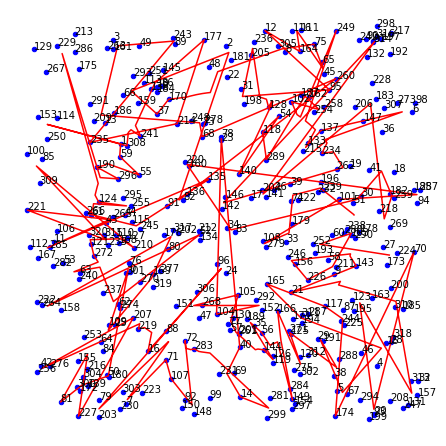

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000011,0.000037
3,0.000023,0.000004
4,0.000015,0.000047
...,...,...
316,-0.000018,-0.000017
317,0.000059,0.000062
318,-0.000035,-0.000040
319,-0.000035,-0.000040


'-----------Iteration: 16000--------------'

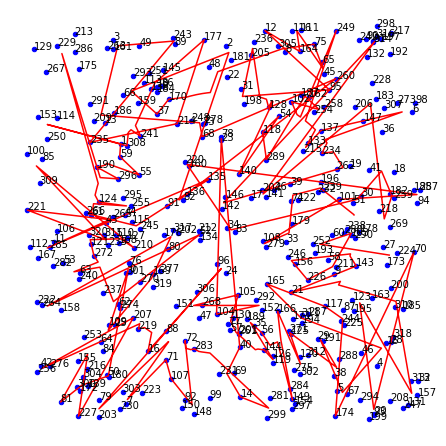

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000009,0.000030
3,0.000018,0.000003
4,0.000013,0.000038
...,...,...
316,-0.000014,-0.000014
317,0.000048,0.000050
318,-0.000028,-0.000032
319,-0.000028,-0.000032


'-----------Iteration: 17000--------------'

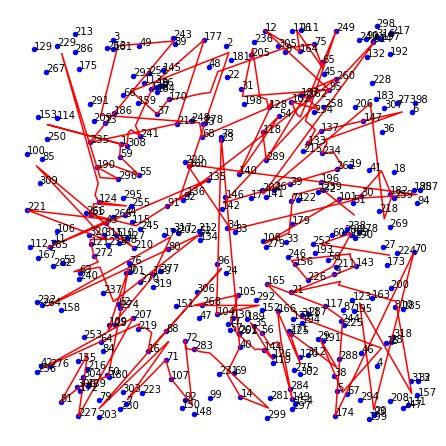

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000007,0.000024
3,0.000015,0.000002
4,0.000010,0.000031
...,...,...
316,-0.000011,-0.000011
317,0.000039,0.000041
318,-0.000023,-0.000027
319,-0.000023,-0.000027


'-----------Iteration: 18000--------------'

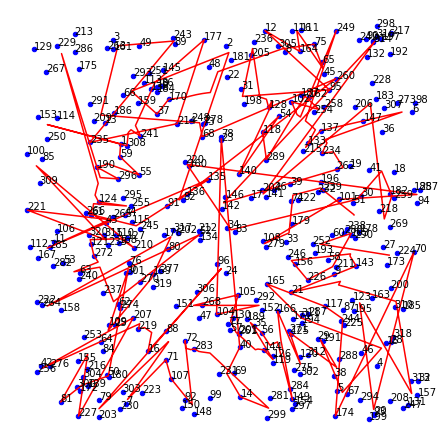

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000006,0.000020
3,0.000012,0.000002
4,0.000008,0.000025
...,...,...
316,-0.000009,-0.000009
317,0.000032,0.000033
318,-0.000018,-0.000022
319,-0.000018,-0.000022


'-----------Iteration: 19000--------------'

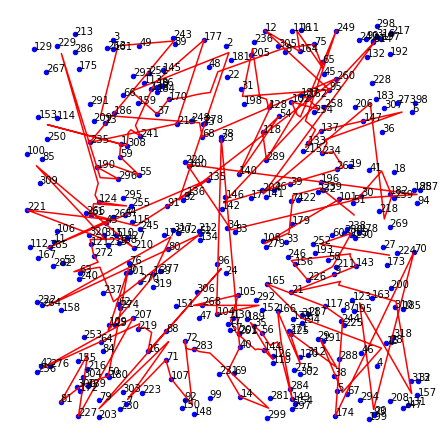

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000005,0.000016
3,0.000010,0.000001
4,0.000007,0.000021
...,...,...
316,-0.000007,-0.000007
317,0.000026,0.000027
318,-0.000015,-0.000018
319,-0.000015,-0.000018


'-----------Iteration: 20000--------------'

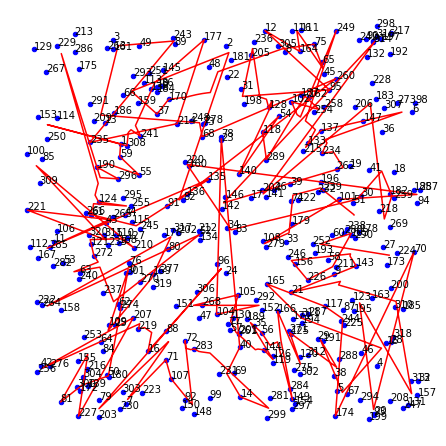

,0,1
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000004,0.000013
3,0.000008,0.000001
4,0.000006,0.000017
...,...,...
316,-0.000006,-0.000006
317,0.000021,0.000022
318,-0.000012,-0.000014
319,-0.000012,-0.000014


'-----------Iteration: 21000--------------'

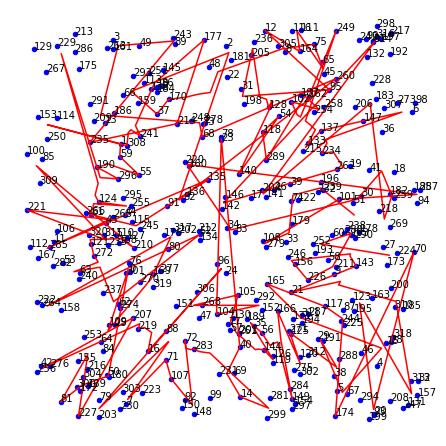

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000003,1.071997e-05
3,0.000007,8.799626e-07
4,0.000004,1.377302e-05
...,...,...
316,-0.000005,-4.939992e-06
317,0.000018,1.795738e-05
318,-0.000010,-1.184915e-05
319,-0.000010,-1.184915e-05


'-----------Iteration: 22000--------------'

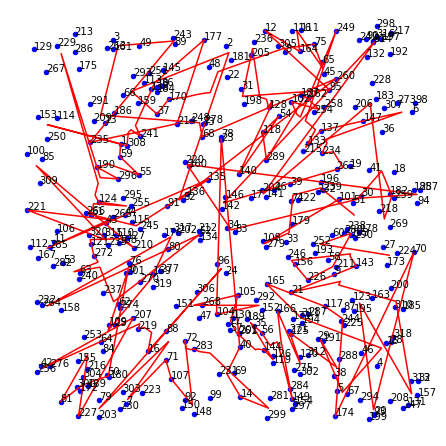

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000003,8.757799e-06
3,0.000005,6.933043e-07
4,0.000004,1.124536e-05
...,...,...
316,-0.000004,-4.041061e-06
317,0.000014,1.466199e-05
318,-0.000008,-9.692849e-06
319,-0.000008,-9.692849e-06


'-----------Iteration: 23000--------------'

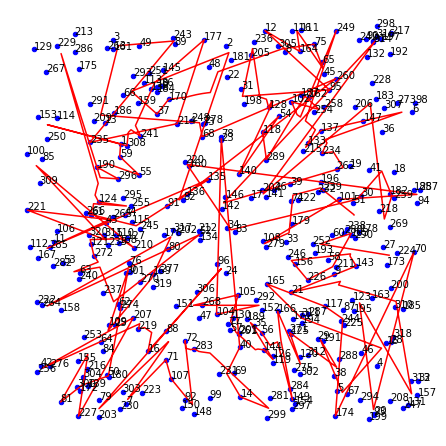

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000002,7.157552e-06
3,0.000004,5.495591e-07
4,0.000003,9.186159e-06
...,...,...
316,-0.000003,-3.306197e-06
317,0.000012,1.197726e-05
318,-0.000007,-7.930118e-06
319,-0.000007,-7.930118e-06


'-----------Iteration: 24000--------------'

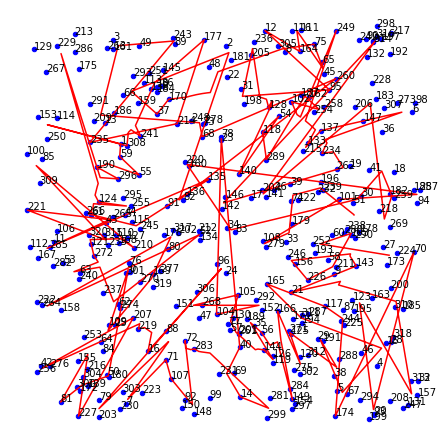

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000002,5.851563e-06
3,0.000004,4.378973e-07
4,0.000002,7.507091e-06
...,...,...
316,-0.000002,-2.705298e-06
317,0.000010,9.788075e-06
318,-0.000005,-6.488751e-06
319,-0.000005,-6.488751e-06


'-----------Iteration: 25000--------------'

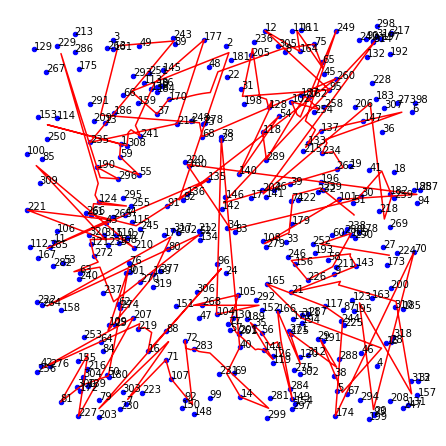

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000001,4.785114e-06
3,0.000003,3.504844e-07
4,0.000002,6.136970e-06
...,...,...
316,-0.000002,-2.213836e-06
317,0.000008,8.001674e-06
318,-0.000004,-5.309906e-06
319,-0.000004,-5.309906e-06


'-----------Iteration: 26000--------------'

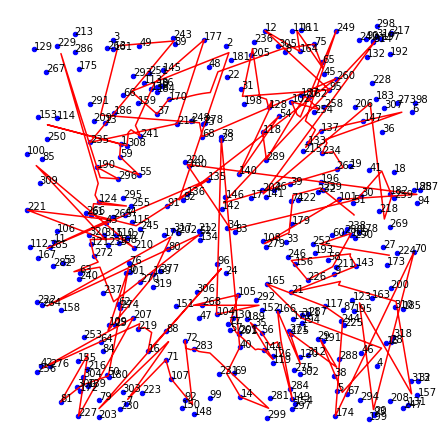

,0,1
0,0.000000,0.000000e+00
1,0.000000,0.000000e+00
2,0.000001,3.913861e-06
3,0.000002,2.815861e-07
4,0.000002,5.018276e-06
...,...,...
316,-0.000002,-1.811807e-06
317,0.000006,6.543077e-06
318,-0.000004,-4.345595e-06
319,-0.000004,-4.345595e-06


'-----------Iteration: 27000--------------'

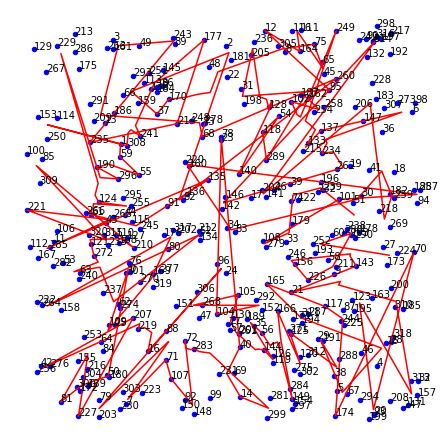

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,9.107360e-07,3.201801e-06
3,1.991774e-06,2.269570e-07
4,1.337905e-06,4.104420e-06
...,...,...
316,-1.280756e-06,-1.482887e-06
317,5.250527e-06,5.351549e-06
318,-2.910654e-06,-3.556656e-06
319,-2.910654e-06,-3.556656e-06


'-----------Iteration: 28000--------------'

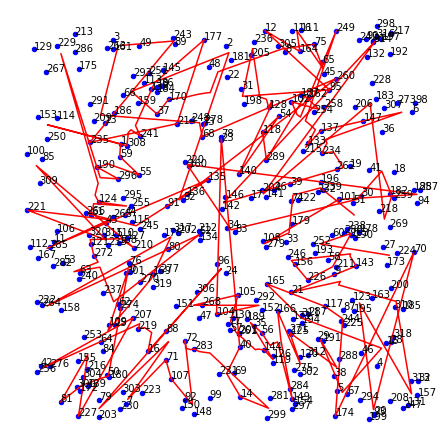

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,7.444807e-07,2.619663e-06
3,1.629902e-06,1.834185e-07
4,1.094464e-06,3.357593e-06
...,...,...
316,-1.043435e-06,-1.213749e-06
317,4.296669e-06,4.377799e-06
318,-2.379852e-06,-2.911116e-06
319,-2.379852e-06,-2.911116e-06


'-----------Iteration: 29000--------------'

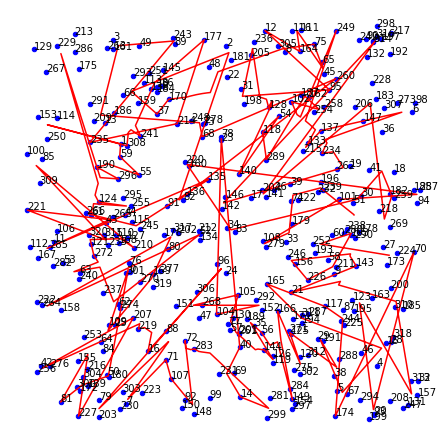

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,6.087460e-07,2.143619e-06
3,1.333893e-06,1.485658e-07
4,8.954522e-07,2.747065e-06
...,...,...
316,-8.508379e-07,-9.935040e-07
317,3.516396e-06,3.581762e-06
318,-1.946316e-06,-2.382855e-06
319,-1.946316e-06,-2.382855e-06


'-----------Iteration: 30000--------------'

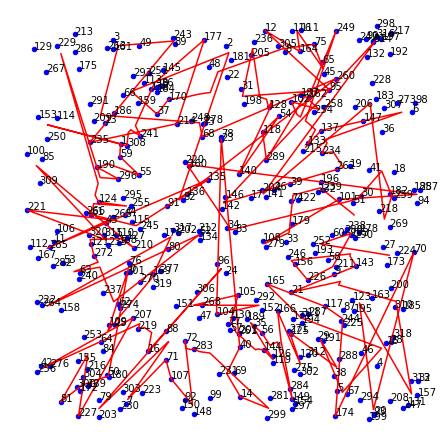

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,4.978729e-07,1.754249e-06
3,1.091721e-06,1.205613e-07
4,7.327170e-07,2.247827e-06
...,...,...
316,-6.942928e-07,-8.132554e-07
317,2.878019e-06,2.930829e-06
318,-1.592069e-06,-1.950530e-06
319,-1.592069e-06,-1.950530e-06


'-----------Iteration: 31000--------------'

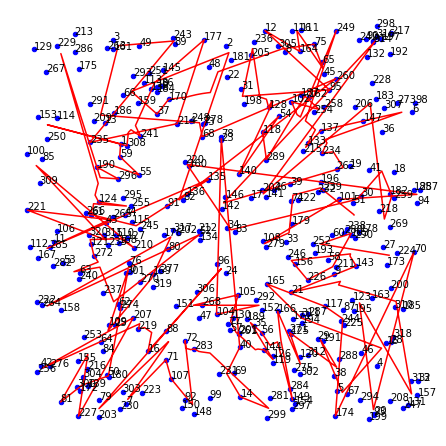

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,4.072700e-07,1.435718e-06
3,8.935693e-07,9.798796e-08
4,5.996163e-07,1.839501e-06
...,...,...
316,-5.668878e-07,-6.657295e-07
317,2.355669e-06,2.398432e-06
318,-1.302506e-06,-1.596694e-06
319,-1.302506e-06,-1.596694e-06


'-----------Iteration: 32000--------------'

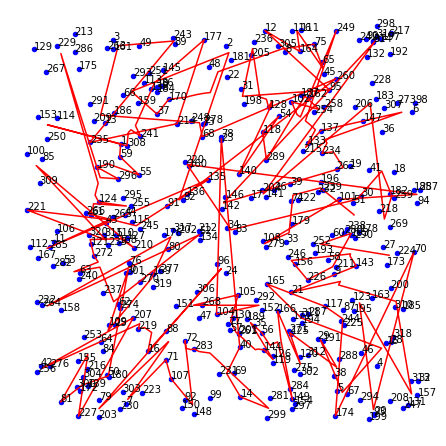

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,3.332063e-07,1.175101e-06
3,7.314181e-07,7.974396e-08
4,4.907338e-07,1.505472e-06
...,...,...
316,-4.630881e-07,-5.449790e-07
317,1.928213e-06,1.962908e-06
318,-1.065749e-06,-1.307080e-06
319,-1.065749e-06,-1.307080e-06


'-----------Iteration: 33000--------------'

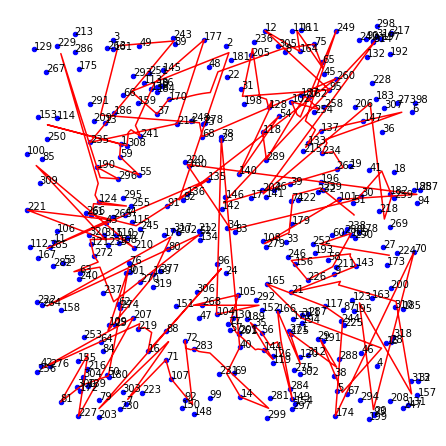

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,2.726457e-07,9.618427e-07
3,5.987152e-07,6.496592e-08
4,4.016498e-07,1.232180e-06
...,...,...
316,-3.784464e-07,-4.461397e-07
317,1.578383e-06,1.606576e-06
318,-8.721208e-07,-1.070020e-06
319,-8.721208e-07,-1.070020e-06


'-----------Iteration: 34000--------------'

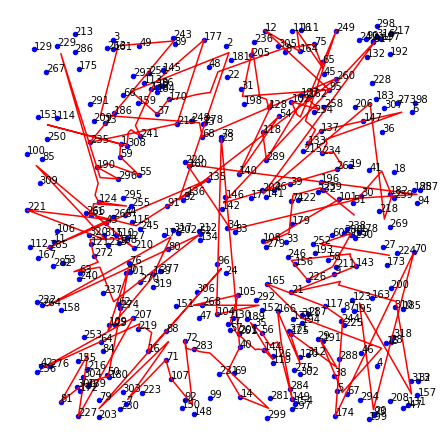

,0,1
0,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00
2,2.231151e-07,7.873207e-07
3,4.901049e-07,5.297315e-08
4,3.287554e-07,1.008555e-06
...,...,...
316,-3.093771e-07,-3.652325e-07
317,1.292062e-06,1.315002e-06
318,-7.137344e-07,-8.759704e-07
319,-7.137344e-07,-8.759704e-07


alpha:  0.000999864476057279
time:  296.58037204999994
Iterations:  34535
Cost:  64535.90263506859


'######### Result #########'

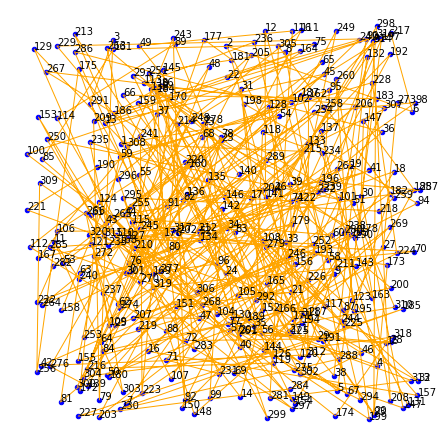

array([290, 163,  60, 265, 204,  29,  72, 114,  89, 271,  18,  76,  37,
       167, 317, 106,  68, 300, 205,  22, 242, 187, 103, 207,  47, 213,
        82, 196, 257, 110, 252, 219,  23, 274, 121, 285,   4, 137, 150,
        58,  70, 127, 275, 247,  30, 147, 188, 154, 255, 171,  39, 236,
       113, 238, 302, 160, 253,  98, 254,  63,  81,  36, 286, 231,  71,
       239,  95, 190, 221,  28,  57,  35, 197,   5, 100, 316, 209,  79,
         3, 291, 176,  10, 307, 144,   9,  64, 206, 277,  96,  73, 141,
        12,  87, 157,  16, 108,  32,  44, 319, 143,  34,  66, 183,  20,
       138,  92, 243, 158, 262, 310, 201, 199, 280,  77, 155,  59, 228,
       224, 261,  15, 174, 168, 129, 308,  91, 104,  51, 293, 149, 124,
       172, 177, 181, 194,  86, 186, 164,  13,  45, 320, 128,  33, 180,
       182, 195, 146,  74,  14,  43, 235,  17, 267, 102, 264,  19, 120,
       184, 130,  67,   8, 145, 283, 112, 111, 203, 156, 189, 159, 101,
       250,  61, 315, 268, 313, 281, 116,  49, 140,  80, 214, 12

In [20]:
np.random.seed(1998)
som=SOM(cities=test3,alpha=1,alphaRate=0.9998,rRate=0.0032)
som.run()